# **PROYECTO: Autoencoders Determinísticos**
*Ilias El Hanouch Toudghi (100472198), Diego Navas Sánchez (100472123) y Alejandro Díaz Cuéllar (100472173)*

En este proyecto exploraremos en profundidad el comportamiento, las capacidades y las limitaciones de los autoencoders determinísticos aplicados a la reconstrucción de imágenes. Nuestro objetivo es comprender cómo diferentes arquitecturas, técnicas de regularización y configuraciones de entrenamiento influyen en la calidad de las representaciones aprendidas y en la fidelidad de las reconstrucciones generadas.

### **Objetivos del Proyecto**

1. **Implementar y comparar múltiples arquitecturas de autoencoders**: Exploraremos tres familias arquitectónicas principales:
   - **Autoencoders lineales**: La forma más básica, basada en capas completamente conectadas, que nos servirá como baseline para entender los fundamentos del aprendizaje de representaciones.
   - **Autoencoders convolucionales**: Diseñados específicamente para datos con estructura espacial (imágenes), aprovechando operaciones convolucionales para capturar patrones locales y jerárquicos.
   - **Autoencoders con bloques residuales**: Una variante avanzada que incorpora conexiones residuales (skip connections) para facilitar el flujo de información y mejorar la capacidad de reconstrucción en redes más profundas.

2. **Evaluar el impacto de técnicas de regularización**: Estudiaremos cómo diferentes métodos de regularización afectan el aprendizaje y la generalización:
   - **Regularización L1 (sparsity)**: Promueve representaciones dispersas, obligando al modelo a utilizar solo un subconjunto de dimensiones latentes.
   - **Regularización L2 (weight decay)**: Penaliza pesos grandes para evitar overfitting y favorecer soluciones más suaves.
   - **Dropout**: Desactiva aleatoriamente neuronas durante el entrenamiento para mejorar la robustez y generalización.
   - **Combinaciones de regularización**: Evaluaremos el efecto sinérgico de aplicar múltiples técnicas simultáneamente.

3. **Explorar aplicaciones de los autoencoders**:
   - **Eliminación de ruido (denoising)**: Entrenaremos modelos capaces de reconstruir imágenes limpias a partir de versiones corrompidas con ruido gaussiano.
   - **Transferencia de conocimiento entre datasets**: Evaluaremos si un modelo entrenado en un dataset simple (MNIST) puede generalizar a uno más complejo (Fashion MNIST).

4. **Analizar el espacio latente aprendido**: Mediante técnicas de visualización como **t-SNE** y **PCA**, examinaremos cómo los autoencoders organizan la información en el espacio latente, evaluando fundamentalmente la separabilidad entre clases

5. **Estudiar factores que influyen en el rendimiento**:
   - **Tamaño del dataset de entrenamiento**: ¿Cómo afecta la cantidad de datos disponibles a la calidad de las reconstrucciones?
   - **Profundidad de las redes**: ¿Más capas siempre significa mejor rendimiento?

### **Datasets Utilizados**

Trabajaremos con dos datasets clásicos de clasificación de imágenes, ampliamente utilizados en la investigación de deep learning:

- **MNIST**: Colección de 70,000 imágenes en escala de grises (28×28 píxeles) de dígitos manuscritos (0-9). Es un dataset relativamente simple, con imágenes bien centradas y poco ruido de fondo, ideal para establecer baselines y probar configuraciones iniciales.

- **Fashion MNIST**: Alternativa más desafiante a MNIST, también con 70,000 imágenes (28×28 píxeles) pero de 10 categorías de prendas de vestir (camisetas, pantalones, zapatos, etc.). Presenta mayor variabilidad intra-clase y mayor complejidad visual, permitiéndonos evaluar la robustez de los modelos.

### **Métricas de Evaluación**

Para cuantificar la calidad de las reconstrucciones utilizaremos el **PSNR (Peak Signal-to-Noise Ratio)**, una métrica estándar en procesamiento de imágenes que mide la relación entre la señal máxima posible y el ruido de distorsión. Un PSNR más alto indica una reconstrucción más fiel a la imagen original. Esta métrica nos permitirá comparar objetivamente el rendimiento de diferentes arquitecturas y configuraciones.

En cuanto a la función de pérdida, usaremos la basada en el **error cuadrático medio (MSE)**.

### **Estructura del Proyecto**

El proyecto se organiza en las siguientes secciones:

1. **Preparación de datos**: Carga, división train/validation/test, y configuración de dataloaders.
2. **Definición de arquitecturas**: Implementación detallada de autoencoders lineales, convolucionales y residuales.
3. **Entrenamiento y evaluación sistemática**: Experimentos comparativos sobre MNIST y Fashion MNIST.
4. **Denoising**: Extensión de la mejor arquitectura para eliminación de ruido.
5. **Experimentos adicionales**: Estudios sobre tamaño de dataset, transferencia entre dominios, y análisis del espacio latente.
6. **Conclusiones**: Síntesis de hallazgos y lecciones aprendidas.

A lo largo de este notebook, combinaremos rigor técnico con análisis práctico, buscando no solo implementar correctamente los modelos, sino también desarrollar una intuición profunda sobre su funcionamiento, sus fortalezas y sus limitaciones en diferentes escenarios.



### Importación de librerías

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import torch
from torch import nn
from torch import optim
import matplotlib.pyplot as plt
from torchvision import datasets, transforms
from torch.utils.data import random_split, DataLoader
import time

torch.manual_seed(0)
np.random.seed(0)

## **1. Preparación de los datos**

En primera instancia, vamos a definir el conjunto de datos a utilizar, que serán MNIST y Fashion MNIST.

In [3]:
# Importamos el dataset MNIST tanto para train como para test y preparamos los loaders
mnist_train_data = datasets.MNIST('./data', train=True, download=True, transform=transforms.ToTensor())
mnist_test_data = datasets.MNIST('./data', train=False, download=True, transform=transforms.ToTensor())

mnist_train_loader = DataLoader(mnist_train_data, batch_size=128, shuffle=True)
mnist_test_loader = DataLoader(mnist_test_data, batch_size=128, shuffle=False)

# Importamos el dataset FMNIST tanto para train como para test y preparamos los loaders
fmnist_train_data = datasets.FashionMNIST('./data', train=True, download=True, transform=transforms.ToTensor())
fmnist_test_data = datasets.FashionMNIST('./data', train=False, download=True, transform=transforms.ToTensor())

fmnist_train_loader = DataLoader(fmnist_train_data, batch_size=128, shuffle=True)
fmnist_test_loader = DataLoader(fmnist_test_data, batch_size=128, shuffle=False)

Una visualización simple para ver la composición del dataset

torch.Size([128, 1, 28, 28]) torch.Size([128])


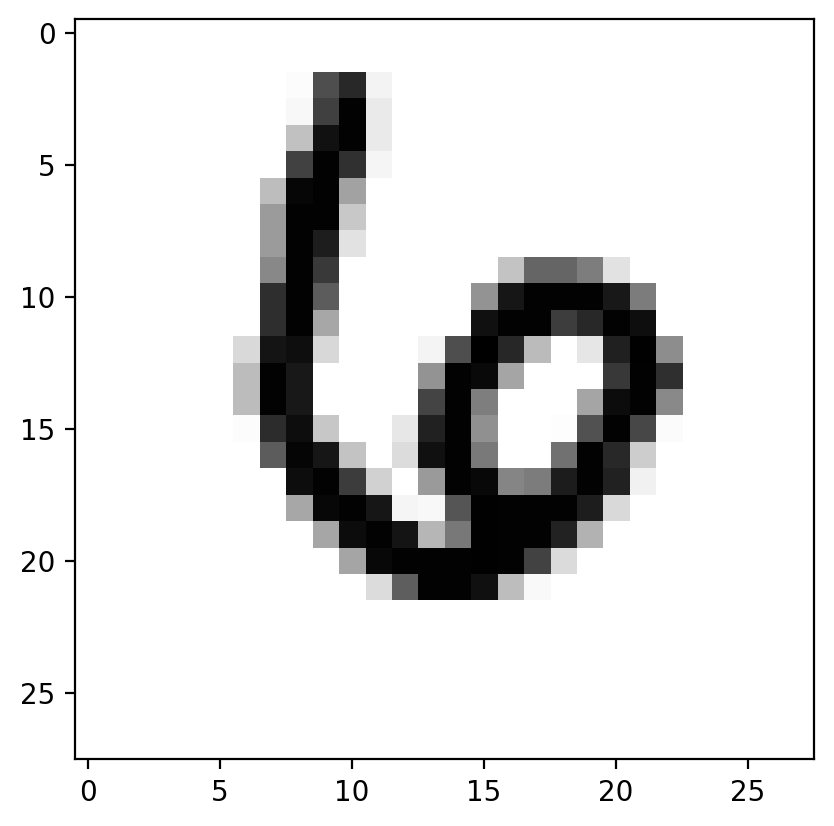

In [4]:
# Mostramos un ejemplo del dataset MNIST
batch_data, batch_labels = next(iter(mnist_train_loader))
print(batch_data.shape, batch_labels.shape)
plt.imshow(batch_data[0].numpy().squeeze(), cmap='gray_r')

torch.Size([128, 1, 28, 28]) torch.Size([128])


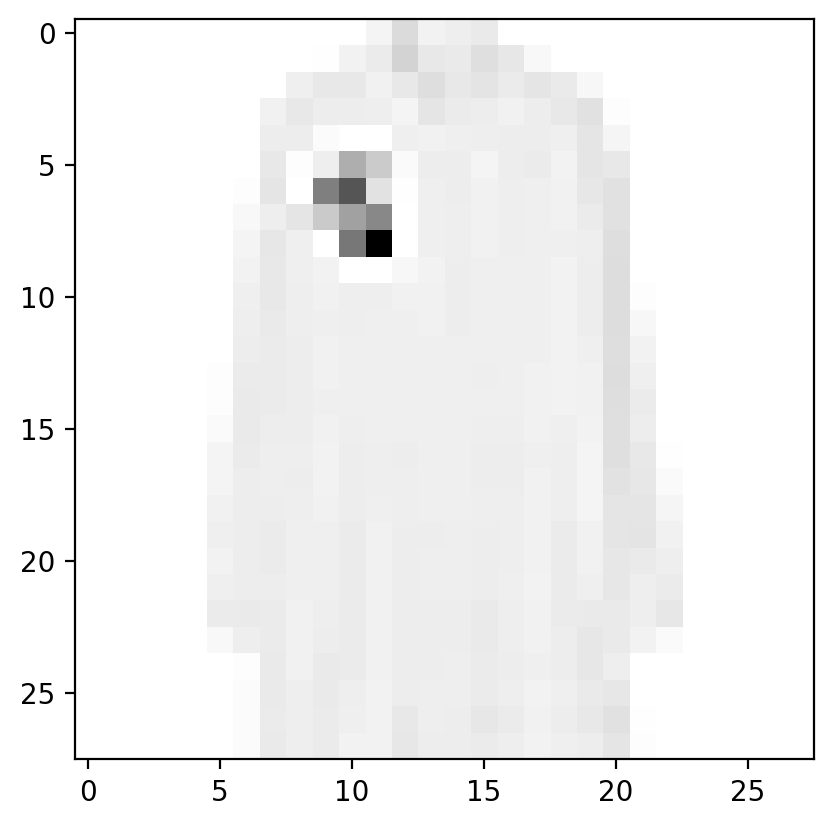

In [5]:
# Mostramos un ejemplo del dataset FMNIST
batch_data, batch_labels = next(iter(fmnist_train_loader))
print(batch_data.shape, batch_labels.shape)
plt.imshow(batch_data[0].numpy().squeeze(), cmap='gray_r')

Vamos a realizar un split 80/20 en el subconjunto de entrenamiento. La parte minoritaria se destinará para lógicamente validación

In [6]:
# Calcula el tamaño para los conjuntos de train y validacion
train_size = int(0.8 * len(mnist_train_data))
valid_size = len(mnist_train_data) - train_size

# Obtener los subconjuntos de train y validacion para MNIST
mnist_train_subset, mnist_valid_subset = random_split(mnist_train_data, [train_size, valid_size])

# DataLoaders para train y validacion de MNIST
mnist_train_loader = torch.utils.data.DataLoader(mnist_train_subset, batch_size=64, shuffle=True, num_workers=2)
mnist_valid_loader = torch.utils.data.DataLoader(mnist_valid_subset, batch_size=64, shuffle=False, num_workers=2)

# Obtener los subconjuntos de train y validacion para FMNIST
fmnist_train_subset, fmnist_valid_subset = random_split(fmnist_train_data, [train_size, valid_size])

# DataLoaders para train y validacion para FMNIST
fmnist_train_loader = torch.utils.data.DataLoader(fmnist_train_subset, batch_size=64, shuffle=True, num_workers=2)
fmnist_valid_loader = torch.utils.data.DataLoader(fmnist_valid_subset, batch_size=64, shuffle=False, num_workers=2)

## **2. Preparación de Arquitecturas**
En este apartado nos centraremos en la definición y descripción detallada de las distintas arquitecturas de autoencoders que emplearemos en nuestro estudio. Comenzaremos presentando los **autoencoders lineales**, que constituyen la forma más básica y directa de esta familia de modelos. A continuación, introduciremos los **autoencoders convolucionales**, diseñados para aprovechar la estructura espacial de los datos y mejorar la capacidad de representación. Finalmente, abordaremos una versión más avanzada mediante **autoencoders con bloques residuales**, concebidos como un intento de optimizar el rendimiento de las arquitecturas convolucionales mediante la integración de conexiones residuales que facilitan el flujo de información y la estabilidad del entrenamiento.


### Definición del autoencoder

Antes de entrar en la implementación concreta de las distintas arquitecturas de autoencoders, presentamos la clase base `Autoencoder`, que servirá como punto de partida para nuestros experimentos. Esta clase encapsula no solo la definición del modelo, sino también los mecanismos de **entrenamiento**, **evaluación** y **seguimiento del rendimiento**, incluyendo métricas como la pérdida y el PSNR. Además, incorpora opciones de **regularización** como Dropout, L1 y L2, y soporta técnicas de **early stopping** para detener el entrenamiento cuando no se observa mejora en la métrica de validación. Esta estructura modular permitirá que las variantes lineales, convolucionales y residuales se implementen de manera consistente y eficiente, manteniendo un flujo claro de entrenamiento y evaluación.


In [7]:
class Autoencoder(nn.Module):
    def __init__(self,
                 input_dim=784,            # 28 * 28 para MNIST/FMNIST
                 C=15,                     # Dimensión del espacio latente (z)
                 dropout_p=0.0,            # Probabilidad de Dropout (0.0 para desactivado)
                 weight_decay=0.0,         # Coeficiente L2 para el optimizador (0.0 para desactivado)
                 l1_lambda=0.0,            # Coeficiente L1 manual (0.0 para desactivado)
                 epochs=15,
                 lr=1e-3,
                 patience=3):

        super().__init__()

        # Parámetros y Regularización
        self.input_dim = input_dim
        self.C = C
        self.dropout_p = dropout_p
        self.l1_lambda = l1_lambda
        self.lr = lr
        self.epochs = epochs
        self.patience = patience

        # Variables para seguimiento
        self.loss_during_training = []
        self.psnr_during_training = []
        self.valid_loss_during_training = []
        self.valid_psnr_during_training = []

    # -----------------------------------------------------------
    # MÉTODOS DE ENTRENAMIENTO Y EVALUACIÓN
    # -----------------------------------------------------------

    def trainloop(self, trainloader, validloader):

        best_val_psnr = float('-inf') # Mejor PSNR es el valor más alto
        epochs_no_improve = 0
        best_model_state = None

        for e in range(int(self.epochs)):

            running_loss = 0.
            start_time = time.time()
            self.train()

            for images, _ in trainloader:

                labels = images # El autoencoder se entrena para reconstruir la entrada
                images, labels = images.to(self.device), labels.to(self.device)

                self.optim.zero_grad()

                out, _ = self.forward(images)

                # Cálculo de la pérdida
                loss = self.criterion(out, labels)

                # Regularización L1 manual
                if self.l1_lambda > 0:
                    l1_norm = sum(p.abs().sum() for p in self.parameters())
                    loss = loss + self.l1_lambda * l1_norm

                running_loss += loss.item()

                loss.backward()
                self.optim.step()


            # Loss del entrenamiento
            train_loss = running_loss/len(trainloader)
            self.loss_during_training.append(train_loss)

            # Evaluacion con la metrica PSNR del entrenamiento
            train_psnr = self.eval_performance(trainloader)
            self.psnr_during_training.append(train_psnr)

            # Loss de la validacion
            val_loss = self.eval_loss(validloader)
            self.valid_loss_during_training.append(val_loss)

            # Evaluación con la métrica PSNR de la validacion
            val_psnr = self.eval_performance(validloader)
            self.valid_psnr_during_training.append(val_psnr)

            time_per_epoch = time.time() - start_time
            #print("Epoch %d. Training loss: %.4f | Training PSNR: %.2f dB | Validation loss: %.4f | Validation PSNR: %.2f dB | Time: %.2f s"
            #         %(e, train_loss, train_psnr, val_loss, val_psnr, time_per_epoch))

            # Early Stopping (basado en PSNR)
            if val_psnr > best_val_psnr:
                best_val_psnr = val_psnr
                epochs_no_improve = 0
                best_model_state = self.state_dict()
            else:
                epochs_no_improve += 1
                if epochs_no_improve >= self.patience:
                    print(f"\nEarly stopping activado en epoch {e}. PSNR no mejoró por {self.patience} épocas.")
                    if best_model_state:
                        self.load_state_dict(best_model_state)
                    break


    def eval_loss(self, dataloader):
        """
        Función de Evaluación de Pérdida
        """
        self.eval() # Cambia a modo evaluación
        running_loss = 0

        with torch.no_grad():
            for images, labels in dataloader:
                labels = images

                images, labels = images.to(self.device), labels.to(self.device)

                out = self.forward(images)[0]

                loss =  self.criterion(out, labels)

                running_loss += loss.item()

        self.train() # Cambia a modo entrenamiento
        return running_loss/len(dataloader)


    def eval_performance(self, dataloader):
        """
        Función de Evaluación de Rendimiento: Calcula el PSNR promedio.
        """
        self.eval() # Cambia a modo evaluacion
        running_psnr = 0
        batch_count = 0

        with torch.no_grad():
            for images, _ in dataloader:
                labels = images

                images, labels = images.to(self.device), labels.to(self.device)

                out, _ = self.forward(images) # Reconstrucción

                # Cálculo del PSNR: compara la imagen original con la reconstruida
                psnr = self.calculate_psnr(labels, out)

                running_psnr += psnr
                batch_count += 1

        self.train() # Cambia de nuevo al modo entrenamiento
        return running_psnr / batch_count

    @staticmethod
    def calculate_psnr(img_true, img_pred, max_val=1.0):
        """
        Calcula el Peak Signal-to-Noise Ratio (PSNR) entre dos imágenes/tensores.
        """
        # Asegurarse de que los tensores son del mismo tamaño y aplanar
        img_true = img_true.view(img_true.size(0), -1)
        img_pred = img_pred.view(img_pred.size(0), -1)

        # Calcular el Error Cuadrático Medio (MSE) por muestra
        mse = torch.mean((img_true - img_pred) ** 2, dim=1)

        # Evitar logaritmo de cero
        mse[mse == 0] = 1e-10

        # Calcular PSNR
        psnr = 10 * torch.log10(max_val**2 / mse)

        # Retornar el PSNR promedio del batch
        return torch.mean(psnr).item()

### **2.1. Autoencoders Lineales**

La clase `LinealAutoencoder` representa un autoencoder de arquitectura **lineal**, diseñado para aprender una representación comprimida de los datos de entrada y luego reconstruirlos de manera aproximada. La idea central es capturar la información más relevante de las imágenes en un **espacio latente de dimensión reducida**, donde cada dimensión codifica características esenciales de la entrada.

El modelo se estructura en dos partes principales:

1. **Encoder**: Esta sección toma la imagen original y la transforma paso a paso en un vector más pequeño, concentrando la información más significativa y eliminando redundancias. Este proceso actúa como un filtro que retiene solo las características más importantes.

2. **Decoder**: A partir de la representación latente obtenida por el encoder, el decoder intenta reconstruir la imagen original. El objetivo es que la salida se parezca lo máximo posible a la entrada inicial, evaluando qué tan bien se ha aprendido la representación comprimida.

El enfoque lineal permite estudiar de forma clara cómo la compresión y reconstrucción afectan a los datos, sirviendo como referencia para comparaciones posteriores con autoencoders más complejos, como los convolucionales o los que incorporan bloques residuales. La atención no está tanto en la programación, sino en entender cómo las distintas capas colaboran para **codificar, condensar y reconstruir la información** de manera eficiente.


In [ ]:

class LinealAutoencoder(Autoencoder):
    def __init__(self, n_layers=3, hidden_size=128, input_dim=784, C=15, dropout_p=0,
                 weight_decay=0, l1_lambda=0, epochs=15, lr=1e-3, patience=3):

        super().__init__(input_dim=input_dim, C=C, dropout_p=dropout_p,
                         weight_decay=weight_decay, l1_lambda=l1_lambda,
                         epochs=epochs, lr=lr, patience=patience)

        # -------------------
        # 1. ENCODER
        # -------------------
        encoder_layers = []
        # Definición de las dimensiones: [784, 128, 64, 32] si n_layers=3 y hidden_size=128
        dims = [input_dim] + [hidden_size // (2**i) for i in range(n_layers)]

        # Múltiples capas ocultas (desde la entrada hasta la penúltima)
        for i in range(n_layers):
            encoder_layers.append(nn.Linear(dims[i], dims[i+1]))
            encoder_layers.append(nn.BatchNorm1d(dims[i+1]))
            encoder_layers.append(nn.ReLU())
            if dropout_p > 0:
                encoder_layers.append(nn.Dropout(dropout_p))

        # Capa final al espacio latente (Cuello de Botella)
        # NOTA: No se aplica BatchNorm1d ni ReLU después de la capa latente
        encoder_layers.append(nn.Linear(dims[-1], C))
        self.encoder = nn.Sequential(*encoder_layers)

        # -------------------
        # 2. DECODER
        # -------------------
        decoder_layers = []

        # Las dimensiones son las del Encoder al revés: [C, 32, 64, 128, 784]
        # decoder_dims_hidden = [C] + dims[1:][::-1]  # [C, 32, 64, 128]
        # La secuencia de dimensiones internas es: [C, 32, 64, 128] -> [32, 64, 128, 784]

        # Las dimensiones de entrada/salida para las n_layers capas internas del decoder
        # La entrada es el espacio latente C. La salida es input_dim (784).

        # Las dimensiones de los 'bloques' del decoder: C -> dims[-1] -> ... -> dims[1] -> input_dim
        # Los bloques son simétricos a los del encoder, pero invirtiendo las conexiones:
        # Encoder: (dim[i] -> dim[i+1])
        # Decoder: (dim[i+1] -> dim[i])

        # Lista de dimensiones: [32, 64, 128] (n_layers=3)
        dims_rev = dims[1:][::-1]

        # Primera capa del Decoder (desde el espacio latente C)
        decoder_layers.append(nn.Linear(C, dims_rev[0]))
        decoder_layers.append(nn.BatchNorm1d(dims_rev[0]))
        decoder_layers.append(nn.ReLU())
        if dropout_p > 0:
             decoder_layers.append(nn.Dropout(dropout_p))

        # Capas ocultas intermedias (simétricas al codificador)
        for i in range(n_layers - 1):
            decoder_layers.append(nn.Linear(dims_rev[i], dims_rev[i+1]))
            decoder_layers.append(nn.BatchNorm1d(dims_rev[i+1]))
            decoder_layers.append(nn.ReLU())
            if dropout_p > 0:
                decoder_layers.append(nn.Dropout(dropout_p))

        # Capa final al tamaño de la entrada (n_layers-ésima capa)
        # Conexión: del último tamaño oculto (dims_rev[-1]) a input_dim
        decoder_layers.append(nn.Linear(dims_rev[-1], input_dim))

        # Usamos Sigmoid para restringir la salida entre [0, 1]
        decoder_layers.append(nn.Sigmoid())
        self.decoder = nn.Sequential(*decoder_layers)

        # Mueve todo a la GPU si esta disponible
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(self.device)

        # Inicialización de Optimizador y Pérdida
        self.optim = optim.Adam(self.parameters(), lr=self.lr, weight_decay=weight_decay)
        # MSELoss (Mean Squared Error) es el estándar para autoencoders de reconstrucción
        self.criterion = nn.MSELoss()

    def forward(self, x):
        # Asume entrada x con forma (batch_size, 1, 28, 28)

        # Aplana la entrada
        batch_size = x.size(0)
        x_flattened = x.view(batch_size, -1) # -> (batch_size, 784)

        # Codificador: x_flattened -> z
        latent = self.encoder(x_flattened) # -> (batch_size, C)

        # Decodificador: z -> x_flat
        x_flat = self.decoder(latent) # -> (batch_size, 784)

        # Remodela la salida a la forma de la imagen original
        # (batch_size, 784) -> (batch_size, 1, 28, 28)
        x_reconstructed = x_flat.view(batch_size, 1, 28, 28)

        return x_reconstructed, latent


### **2.2. Autoencoders Convolucionales**

En esta sección presentamos un autoencoder **convolucional**, diseñado para trabajar directamente con la **estructura de las imágenes**. A diferencia del autoencoder lineal, que trata cada píxel de manera independiente, la versión convolucional puede captar **patrones locales y relaciones espaciales**, mejorando así la capacidad de reconstrucción y la calidad de la representación.

El proceso sigue la misma idea básica: primero se condensa la información más importante de la imagen en un espacio reducido, y luego se reconstruye la imagen a partir de esa representación comprimida. Además, se pueden aplicar técnicas de regularización como Dropout, que ayudan a que el modelo no dependa demasiado de detalles específicos y generalice mejor.

Para estudiar cómo influye la **profundidad de la red**, se explorarán variantes con diferentes números de capas, permitiendo observar cómo aumentar la complejidad afecta la calidad de la reconstrucción.

In [9]:
# Autoencoder Convolucional
class ConvAutoencoder(Autoencoder):
    def __init__(self, C=15, dropout_p=0.0, weight_decay=0.0, l1_lambda=0.0, epochs=15, lr=1e-3, patience=3):

        super().__init__(input_dim=784, C=C, dropout_p=dropout_p,
                         weight_decay=weight_decay, l1_lambda=l1_lambda,
                         epochs=epochs, lr=lr, patience=patience)

    def forward(self, x):
        latent = self.encoder(x)
        x_reconstructed_img = self.decoder(latent)

        return x_reconstructed_img, latent

    def insert_dropout(self, layers, dropout_p):
        # Inserta dropout despues de cada capa
        result = []
        for layer in layers:
            result.append(layer)
            result.append(nn.Dropout2d(dropout_p))
        return result

#### Encoder convolucional de tres capas

In [ ]:
class ThreeLayersConvAutoencoder(ConvAutoencoder):
  def __init__(self, in_channels=1, C=15, kernel_size=3, padding=1,
                 stride=1, dropout_p=0.0, weight_decay=0.0, l1_lambda=0.0,
                 epochs=15, lr=1e-3, patience=3):

        super().__init__(C=C, dropout_p=dropout_p,
                         weight_decay=weight_decay, l1_lambda=l1_lambda,
                         epochs=epochs, lr=lr, patience=patience)

        self.in_channels = in_channels
        self.kernel_size = kernel_size
        self.padding = padding
        self.stride = stride

        # Progresión de canales: 1 -> C/4 -> C/2 -> C
        C_div_4 = C // 4
        C_div_2 = C // 2
        C_final = C

        # -----------------------------------------------
        # 1. ENCODER
        # -----------------------------------------------

        # Layer 1: 28x28x1 -> 14x14x(C/4)
        self.encoder_layer1 = nn.Sequential(
            nn.Conv2d(in_channels, C_div_4, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_div_4), nn.ReLU(True),
            nn.MaxPool2d(2, 2)
        )
        # Layer 2: 14x14x(C/4) -> 7x7x(C/2)
        self.encoder_layer2 = nn.Sequential(
            nn.Conv2d(C_div_4, C_div_2, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_div_2), nn.ReLU(True),
            nn.MaxPool2d(2, 2)
        )
        # Layer 3: 7x7x(C/2) -> 3x3x(C)
        self.encoder_layer3 = nn.Sequential(
            nn.Conv2d(C_div_2, C_final, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_final), nn.ReLU(True),
            nn.MaxPool2d(2, 2) # Asumiendo que 7x7 con k=3, p=1, s=1 -> 7x7. Luego MaxPool2d(2,2) -> 3x3 (o 4x4, dependiendo del borde)
        )

        # Combinar el encoder
        encoder_layers = [self.encoder_layer1, self.encoder_layer2, self.encoder_layer3]
        if dropout_p > 0:
            self.encoder = nn.Sequential(
                *self.insert_dropout(encoder_layers, dropout_p)
            )
        else:
            self.encoder = nn.Sequential(*encoder_layers)

        # Definición del Espacio Latente
        self.latent_channels = C_final
        self.latent_spatial_dim = 3 # Asumiendo 3x3 después de las capas de pooling.

        # ---------------------------------------------------------------------
        # 2. DECODER (Ajustado)
        # ---------------------------------------------------------------------

        # Layer 1 ConvTranspose: C -> C/2. Spatial: 3x3 -> 7x7
        self.decoder_layer1 = nn.Sequential(
            nn.ConvTranspose2d(C_final, C_div_2, kernel_size=4, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(C_div_2), nn.ReLU(True)
        )

        # Layer 2 ConvTranspose: C/2 -> C/4. Spatial: 7x7 -> 14x14
        self.decoder_layer2 = nn.Sequential(
            nn.ConvTranspose2d(C_div_2, C_div_4, kernel_size=2, stride=2, padding=0),
            nn.BatchNorm2d(C_div_4), nn.ReLU(True)
        )

        # Layer 3 ConvTranspose: C/4 -> in_channels. Spatial: 14x14 -> 28x28
        # Esta capa es la que produce la imagen final.
        self.decoder_layer3 = nn.Sequential(
            nn.ConvTranspose2d(C_div_4, in_channels, kernel_size=2, stride=2, padding=0),
        )

        # Capa Conv2d Final y Activación (Ajuste)
        # Se mantiene la convolución 1x1 por si quieres un ajuste fino de canales/dimensiones,
        # aunque es opcional si decoder_layer3 ya va a in_channels=1.
        self.decoder_final_conv = nn.Conv2d(in_channels, in_channels, kernel_size=1, padding=0, stride=1)
        self.decoder_final_act = nn.Sigmoid()

        # Combinar el decoder (añadiendo Dropout si aplica)
        decoder_layers = [self.decoder_layer1, self.decoder_layer2, self.decoder_layer3]
        if dropout_p > 0:
            self.decoder = nn.Sequential(
                *self.insert_dropout(decoder_layers, dropout_p),
                self.decoder_final_conv,
                self.decoder_final_act
            )
        else:
            self.decoder = nn.Sequential(
                *decoder_layers,
                self.decoder_final_conv,
                self.decoder_final_act
            )

        # Inicialización de Optimizador y Pérdida
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(self.device)
        self.optim = optim.Adam(self.parameters(), lr=self.lr, weight_decay=weight_decay)
        self.criterion = nn.MSELoss()

#### Encoder convolucional de cuatro capas

In [11]:
class FourLayersConvAutoencoder(ConvAutoencoder):
    def __init__(self, in_channels=1, C=100, kernel_size=3, padding=1,
                 stride=1, dropout_p=0.0, weight_decay=0.0, l1_lambda=0.0,
                 epochs=20, lr=1e-3, patience=5):

        super().__init__(C=C, dropout_p=dropout_p,
                         weight_decay=weight_decay, l1_lambda=l1_lambda,
                         epochs=epochs, lr=lr, patience=patience)

        C_div_4 = C // 4
        C_div_2 = C // 2
        C_final = C

        # -----------------
        # ENCODER
        # -----------------
        self.encoder_layer1 = nn.Sequential(
            nn.Conv2d(in_channels, C_div_4, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(C_div_4), nn.ReLU(True),
            nn.MaxPool2d(2,2)   # 28->14
        )

        self.encoder_layer2 = nn.Sequential(
            nn.Conv2d(C_div_4, C_div_2, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(C_div_2), nn.ReLU(True),
            nn.MaxPool2d(2,2)   # 14->7
        )

        self.encoder_layer3 = nn.Sequential(
            nn.Conv2d(C_div_2, C_final, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(C_final), nn.ReLU(True),
            nn.MaxPool2d(2,2)   # 7->3
        )

        self.encoder_layer4 = nn.Sequential(
            nn.Conv2d(C_final, C_final, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(C_final), nn.ReLU(True),
            # Mantener 3x3, no pool adicional
        )

        self.encoder = nn.Sequential(
            self.encoder_layer1, self.encoder_layer2,
            self.encoder_layer3, self.encoder_layer4
        )

        self.latent_channels = C_final
        self.latent_spatial_dim = 3  # 3x3

        # -----------------
        # DECODER
        # -----------------
        # 3x3 -> 7x7
        self.decoder_layer1 = nn.Sequential(
            nn.ConvTranspose2d(C_final, C_div_2, kernel_size=4, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(C_div_2), nn.ReLU(True)
        )

        # 7x7 -> 14x14  
        self.decoder_layer2 = nn.Sequential(
            nn.ConvTranspose2d(C_div_2, C_div_4, kernel_size=2, stride=2, padding=0),
            nn.BatchNorm2d(C_div_4), nn.ReLU(True)
        )

        # 14x14 -> 28x28
        self.decoder_layer3 = nn.Sequential(
            nn.ConvTranspose2d(C_div_4, in_channels, kernel_size=2, stride=2, padding=0),
            nn.Sigmoid()
        )

        self.decoder = nn.Sequential(
            self.decoder_layer1, self.decoder_layer2,
            self.decoder_layer3
        )

        # Optimizer & Loss
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(self.device)
        self.optim = optim.Adam(self.parameters(), lr=lr, weight_decay=weight_decay)
        self.criterion = nn.MSELoss()


#### Encoder convolucional de cinco capas

In [ ]:
class FiveLayersConvAutoencoder(ConvAutoencoder):
  def __init__(self, in_channels=1, C=15, kernel_size=3, padding=1,
                 stride=1, dropout_p=0.0, weight_decay=0.0, l1_lambda=0.0,
                 epochs=15, lr=1e-3, patience=3):

        super().__init__(C=C, dropout_p=dropout_p,
                         weight_decay=weight_decay, l1_lambda=l1_lambda,
                         epochs=epochs, lr=lr, patience=patience)

        self.in_channels = in_channels
        self.kernel_size = kernel_size
        self.padding = padding
        self.stride = stride

        # Progresión de canales
        C_intermedio_1 = 8
        C_intermedio_2 = 16
        C_intermedio_3 = 32
        C_intermedio_4 = 64
        C_final = C

        # -----------------------------------------------
        ## 1. ENCODER
        # -----------------------------------------------

        # Layer 1: 28x28x1 -> 14x14x8
        self.encoder_layer1 = nn.Sequential(
            nn.Conv2d(in_channels, C_intermedio_1, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_intermedio_1), nn.ReLU(True), nn.MaxPool2d(2, 2)
        )
        # Layer 2: 14x14x8 -> 7x7x16
        self.encoder_layer2 = nn.Sequential(
            nn.Conv2d(C_intermedio_1, C_intermedio_2, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_intermedio_2), nn.ReLU(True), nn.MaxPool2d(2, 2)
        )
        # Layer 3: 7x7x16 -> 3x3x32
        self.encoder_layer3 = nn.Sequential(
            nn.Conv2d(C_intermedio_2, C_intermedio_3, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_intermedio_3), nn.ReLU(True), nn.MaxPool2d(2, 2)
        )
        # Layer 4: 3x3x32 -> 1x1x64
        self.encoder_layer4 = nn.Sequential(
            nn.Conv2d(C_intermedio_3, C_intermedio_4, kernel_size=kernel_size, padding=padding, stride=stride),
            nn.BatchNorm2d(C_intermedio_4), nn.ReLU(True), nn.MaxPool2d(2, 2)
        )
        # Layer 5 (Latente): 1x1x64 -> 1x1xC (Proyección de canales)
        # Se mantiene BatchNorm2d y ReLU aquí, ya que es el final del encoder.
        self.encoder_layer5 = nn.Sequential(
            nn.Conv2d(C_intermedio_4, C_final, kernel_size=1, padding=0, stride=1),
            nn.BatchNorm2d(C_final), nn.ReLU(True)
        )

        # Definición del Espacio Latente
        self.latent_channels = C_final
        self.latent_spatial_dim = 1

        encoder_layers = [self.encoder_layer1, self.encoder_layer2, self.encoder_layer3, self.encoder_layer4, self.encoder_layer5]
        self.encoder = nn.Sequential(*self.insert_dropout(encoder_layers, dropout_p)) if dropout_p > 0 else nn.Sequential(*encoder_layers)

        # ---------------------------------------------------------------------
        ## 2. DECODER (Ajustado)
        # ---------------------------------------------------------------------

        # Layer 1 ConvTranspose: C -> 64. Spatial: 1x1 -> 1x1 (Proyección de canales inversa)
        self.decoder_layer1 = nn.Sequential(
            nn.ConvTranspose2d(C_final, C_intermedio_4, kernel_size=1, stride=1, padding=0),
            nn.BatchNorm2d(C_intermedio_4), nn.ReLU(True)
        )
        # Layer 2 ConvTranspose: 64 -> 32. Spatial: 1x1 -> 3x3
        self.decoder_layer2 = nn.Sequential(
            nn.ConvTranspose2d(C_intermedio_4, C_intermedio_3, kernel_size=4, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(C_intermedio_3), nn.ReLU(True)
        )
        # Layer 3 ConvTranspose: 32 -> 16. Spatial: 3x3 -> 7x7
        self.decoder_layer3 = nn.Sequential(
            nn.ConvTranspose2d(C_intermedio_3, C_intermedio_2, kernel_size=4, stride=2, padding=1, output_padding=1),
            nn.BatchNorm2d(C_intermedio_2), nn.ReLU(True)
        )
        # Layer 4 ConvTranspose: 16 -> 8. Spatial: 7x7 -> 14x14
        self.decoder_layer4 = nn.Sequential(
            nn.ConvTranspose2d(C_intermedio_2, C_intermedio_1, kernel_size=2, stride=2, padding=0),
            nn.BatchNorm2d(C_intermedio_1), nn.ReLU(True)
        )
        # Layer 5 ConvTranspose: 8 -> in_channels. Spatial: 14x14 -> 28x28
        self.decoder_layer5 = nn.Sequential(
            nn.ConvTranspose2d(C_intermedio_1, in_channels, kernel_size=2, stride=2, padding=0),
        )

        # Capa Conv2d Final (Ajuste de canales: 1 -> 1)
        self.decoder_final_conv = nn.Conv2d(in_channels, in_channels, kernel_size=1, padding=0, stride=1)
        self.decoder_final_act = nn.Sigmoid()

        # Combinamos las capas intermedias para el Dropout. Excluimos las capas finales de reconstrucción.
        decoder_intermediate_layers = [
            self.decoder_layer1, self.decoder_layer2, self.decoder_layer3, self.decoder_layer4, self.decoder_layer5
        ]

        if dropout_p > 0:
            decoder_sequence = self.insert_dropout(decoder_intermediate_layers, dropout_p) + [self.decoder_final_conv, self.decoder_final_act]
            self.decoder = nn.Sequential(*decoder_sequence)
        else:
            self.decoder = nn.Sequential(
                *decoder_intermediate_layers,
                self.decoder_final_conv,
                self.decoder_final_act
            )

        # Inicialización de Optimizador y Pérdida
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(self.device)
        self.optim = optim.Adam(self.parameters(), lr=self.lr, weight_decay=weight_decay)
        self.criterion = nn.MSELoss()

### **2.3. Autoencoders Residuales**

En esta sección exploramos un **autoencoder convolucional con conexiones residuales**, que busca mejorar la calidad de la reconstrucción de imágenes captando de manera más efectiva las relaciones entre capas. La idea central de las conexiones residuales es **permitir que la información fluya directamente a través de la red**, facilitando el aprendizaje y evitando la pérdida de detalles importantes durante la codificación y decodificación.

El modelo sigue la misma filosofía básica de encoder y decoder: primero se condensa la información más relevante de la imagen en un espacio latente y luego se reconstruye. Sin embargo, las conexiones residuales permiten que **la salida de capas anteriores se combine con capas posteriores**, ayudando a conservar detalles finos y a mejorar métricas de reconstrucción como el PSNR.

Este enfoque representa un paso avanzado respecto a los autoencoders convolucionales simples, ya que **maximiza la eficiencia del aprendizaje y la fidelidad de la reconstrucción**. Más adelante se explorarán variantes que ajustan la profundidad y la complejidad de estas conexiones residuales para evaluar su impacto en la calidad final de las imágenes reconstruidas.


In [ ]:
class ResidualConvAutoencoder(ConvAutoencoder):
    """
    Autoencoder convolucional con conexiones residuales para maximizar PSNR
    """
    def __init__(self, in_channels=1, latent_channels=64, latent_spatial=7, 
                 dropout_p=0.0, weight_decay=0.0, l1_lambda=0.0,
                 epochs=80, lr=1e-3, patience=10):
        
        super().__init__(C=latent_channels, dropout_p=dropout_p,
                         weight_decay=weight_decay, l1_lambda=l1_lambda,
                         epochs=epochs, lr=lr, patience=patience)
        
        self.latent_channels = latent_channels
        self.latent_spatial = latent_spatial
        
        # Encoder con conexiones residuales
        
        # Capa 1: 28x28x1 -> 14x14x32
        self.enc_conv1 = nn.Conv2d(in_channels, 32, kernel_size=3, padding=1, stride=1)
        self.enc_bn1 = nn.BatchNorm2d(32)
        self.enc_pool1 = nn.MaxPool2d(2, 2)
        
        # Capa 2: 14x14x32 -> 7x7x64  
        self.enc_conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1, stride=1)
        self.enc_bn2 = nn.BatchNorm2d(64)
        self.enc_pool2 = nn.MaxPool2d(2, 2)
        
        # Capa 3: 7x7x64 -> 7x7x latent_channels (refinamiento sin pooling)
        self.enc_conv3 = nn.Conv2d(64, latent_channels, kernel_size=3, padding=1, stride=1)
        self.enc_bn3 = nn.BatchNorm2d(latent_channels)
        
        # Conexión residual para capa 3 (64 -> latent_channels)
        self.enc_skip3 = nn.Conv2d(64, latent_channels, kernel_size=1, stride=1) if latent_channels != 64 else nn.Identity()
        
        # Decoder con conexiones residuales
        
        # Capa 1: 7x7x latent_channels -> 7x7x64
        self.dec_conv1 = nn.Conv2d(latent_channels, 64, kernel_size=3, padding=1, stride=1)
        self.dec_bn1 = nn.BatchNorm2d(64)
        
        # Capa 2: 7x7x64 -> 14x14x32
        self.dec_upsample2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False)
        self.dec_conv2 = nn.Conv2d(64, 32, kernel_size=3, padding=1, stride=1)
        self.dec_bn2 = nn.BatchNorm2d(32)
        
        # Capa 3: 14x14x32 -> 28x28x16
        self.dec_upsample3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False) 
        self.dec_conv3 = nn.Conv2d(32, 16, kernel_size=3, padding=1, stride=1)
        self.dec_bn3 = nn.BatchNorm2d(16)
        
        # Capa final: 28x28x16 -> 28x28x1
        self.dec_final = nn.Conv2d(16, in_channels, kernel_size=3, padding=1, stride=1)
        
        # Proyecciones para conexiones residuales
        self.skip_proj2 = nn.Conv2d(32, 32, kernel_size=1)  # Proyección para enc1 -> dec2
        self.skip_proj3 = nn.Conv2d(64, 16, kernel_size=1)  # Proyección para enc2 -> dec3
        
        # Activaciones
        self.relu = nn.ReLU(inplace=True)
        self.sigmoid = nn.Sigmoid()
        
        # Inicialización
        self.device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.to(self.device)
        self.optim = optim.Adam(self.parameters(), lr=lr, weight_decay=weight_decay)
        self.criterion = nn.MSELoss()
        
    def forward(self, x):        
        # Encoder Layer 1: 28x28x1 -> 14x14x32
        enc1 = self.enc_conv1(x)
        enc1 = self.enc_bn1(enc1)
        enc1 = self.relu(enc1)
        enc1_pooled = self.enc_pool1(enc1)
        
        # Encoder Layer 2: 14x14x32 -> 7x7x64
        enc2 = self.enc_conv2(enc1_pooled)
        enc2 = self.enc_bn2(enc2)  
        enc2 = self.relu(enc2)
        enc2_pooled = self.enc_pool2(enc2)
        
        # Encoder Layer 3: 7x7x64 -> 7x7x latent_channels (con residual)
        enc3 = self.enc_conv3(enc2_pooled)
        enc3 = self.enc_bn3(enc3)
        
        # Conexión residual
        skip3 = self.enc_skip3(enc2_pooled)
        latent = self.relu(enc3 + skip3)  # Residual connection
        
        # Decoder forward
        
        # Decoder Layer 1: 7x7x latent_channels -> 7x7x64
        dec1 = self.dec_conv1(latent)
        dec1 = self.dec_bn1(dec1)
        dec1 = self.relu(dec1)
        
        # Conexión residual: enc2_pooled + dec1
        if dec1.shape == enc2_pooled.shape:
            dec1 = dec1 + enc2_pooled  # Skip connection desde encoder
        
        # Decoder Layer 2: 7x7x64 -> 14x14x32
        dec2 = self.dec_upsample2(dec1)
        dec2 = self.dec_conv2(dec2)
        dec2 = self.dec_bn2(dec2)
        dec2 = self.relu(dec2)
        
        # Conexión residual: enc1_pooled + dec2 (proyectada)
        skip2 = self.skip_proj2(enc1_pooled)
        if dec2.shape == skip2.shape:
            dec2 = dec2 + skip2  # Skip connection desde encoder
        
        # Decoder Layer 3: 14x14x32 -> 28x28x16
        dec3 = self.dec_upsample3(dec2)
        dec3 = self.dec_conv3(dec3)
        dec3 = self.dec_bn3(dec3)
        dec3 = self.relu(dec3)
        
        # Conexión residual: enc2 -> dec3 (proyectada y redimensionada)
        skip3_proj = self.skip_proj3(enc2)
        skip3_up = nn.functional.interpolate(skip3_proj, size=dec3.shape[2:], mode='bilinear', align_corners=False)
        if dec3.shape == skip3_up.shape:
            dec3 = dec3 + skip3_up  # Skip connection desde encoder
        
        # Capa final: 28x28x16 -> 28x28x1
        output = self.dec_final(dec3)
        output = self.sigmoid(output)
        
        return output, latent

## **3. Entrenamiento y Evaluación**

Con los modelos anteriores ya definidos, vamos a pasar a descirbir los pasos del entrenamiento. Antes vamos a definir algunos de los hiperparámetros más esenciales por defecto para cuestiones de regularización, definir el bucle principal de *training* y observar la evolución de los mismos a través de todos estos modelos, aunque luego para cada modelo es posible que se usen diferentes combinaciones.

### **3.1. Pipeline de Entrenamiento**

In [14]:
# Probabilidad de Dropout
DROPOUT_P = 0.2
# Hiperparámetro para la penalización L1 (sparsity)
L1_LAMBDA = 1e-5
# Hiperparámetro para la penalización L2 (weight decay)
L2_LAMBDA = 1e-4
# Hidden size para modelos lineales de 5 capas
HIDDEN_SIZE_5_LAYERS = 256

In [15]:
# Funcion para entrenar y evaluar los modelos
def train_eval_autoencoders(autoencoders, train_loader, valid_loader, test_loader):
    model_eval = {}

    # Entrenamiento y evaluacion de los modelos
    for autoencoder_name, autoencoder in autoencoders.items():
        # Entrena el modelo
        autoencoder.trainloop(train_loader, valid_loader)

        # Crea la figura
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4), sharex=True)

        # Titulo de la figura
        fig.suptitle(autoencoder_name, fontsize=14, fontweight='bold')

        # Grafica PSNR
        ax1.plot(autoencoder.psnr_during_training, label='Training PSNR')
        ax1.plot(autoencoder.valid_psnr_during_training, label='Validation PSNR')

        ax1.set_xlabel('Epoch')
        ax1.set_ylabel('PSNR (dB)')
        ax1.legend()
        ax1.grid(True)

        # Grafica Loss
        ax2.plot(autoencoder.loss_during_training, label='Training Loss')
        ax2.plot(autoencoder.valid_loss_during_training, label='Validation Loss')

        ax2.set_xlabel('Epoch')
        ax2.set_ylabel('Loss (MSE)')
        ax2.legend()
        ax2.grid(True)

        # Muestra la figura
        plt.tight_layout()
        plt.show()

        # Evalua al modelo
        model_eval[autoencoder_name] = autoencoder.eval_performance(test_loader)

    return pd.DataFrame.from_dict(model_eval, orient='index', columns=['PSNR'])

### **3.2. Configuración de Modelos**

Se define la configuración para los modelos lineales probando varias capas y con diferentes tipos de regularización L1/L2, tipos de dropout, etc.

In [16]:
# Configuracion de Autoencoders Lineales
autoencoders_linear = {
    # Modelos base sin regularización
    'Linear Base 3L C30': LinealAutoencoder(n_layers=3, C=30),
    'Linear Base 5L C50': LinealAutoencoder(n_layers=5, C=50, hidden_size=HIDDEN_SIZE_5_LAYERS),
    
    # Modelo con regularización L1 (sparsity)
    'Linear C30 L1': LinealAutoencoder(n_layers=3, C=30, l1_lambda=L1_LAMBDA),
    
    # Modelo con dropout
    'Linear C50 DO': LinealAutoencoder(n_layers=5, C=50, hidden_size=HIDDEN_SIZE_5_LAYERS, dropout_p=DROPOUT_P),
    
    # Modelo con regularización combinada L2+Dropout
    'Linear C100 L2+DO': LinealAutoencoder(n_layers=5, C=100, hidden_size=HIDDEN_SIZE_5_LAYERS, weight_decay=L2_LAMBDA, dropout_p=DROPOUT_P),
}

Probaremos varios tipos de convolución con diferentes capas y configuraciones

In [17]:
# Configuracion de Autoencoders Convolucionales
autoencoders_conv = {
    # Modelos base sin regularización
    'Conv Base 3L C30': ThreeLayersConvAutoencoder(C=30),
    'Conv Base 5L C50': FiveLayersConvAutoencoder(C=50),
    'Conv Base 3L C100': ThreeLayersConvAutoencoder(C=100),
    
    # Modelo con regularización L1 (sparsity)
    'Conv L1 3L C30': ThreeLayersConvAutoencoder(C=30, l1_lambda=L1_LAMBDA),
    
    # Modelo con dropout
    'Conv DO 3L C100': ThreeLayersConvAutoencoder(C=100, dropout_p=DROPOUT_P),
    'Conv DO 5L C50': FiveLayersConvAutoencoder(C=50, dropout_p=DROPOUT_P),
    
    # Modelo con regularización combinada L2+Dropout
    'Conv L2+DO 5L C100': FiveLayersConvAutoencoder(C=100, weight_decay=L2_LAMBDA, dropout_p=DROPOUT_P),
}

Por último, 3 tipos de redes residuales, en menor proporción a los demás debido al alto coste computacional en GPU que requiere el entrenarlas.

In [18]:
# Configuracion de Autoencoders Residuales
autoencoders_residual = {
    'Residual Base 64ch': ResidualConvAutoencoder(
        latent_channels=64, latent_spatial=7, 
        epochs=60, lr=1e-3, patience=8
    ),
    'Residual Large 128ch': ResidualConvAutoencoder(
        latent_channels=128, latent_spatial=7,
        epochs=80, lr=8e-4, patience=10
    ),
    'Residual 96ch + L2': ResidualConvAutoencoder(
        latent_channels=96, latent_spatial=7,
        epochs=70, lr=9e-4, patience=9,
        weight_decay=1e-5
    ),
}

In [19]:
# Combinamos todos los modelos, listos para entrenar
autoencoders_all = {**autoencoders_linear, **autoencoders_conv, **autoencoders_residual}

### **3.3. Entrenamiento y Evaluación sobre MNIST**

Vamos a entrenar todos los modelos sobre el dataset más básico de los 2, MNIST. Para ello vamos a graficar los resultados una vez finalizado el entrenamiento para poder visualizar mucho mejor a lo largo de las épocas de entrenamiento.

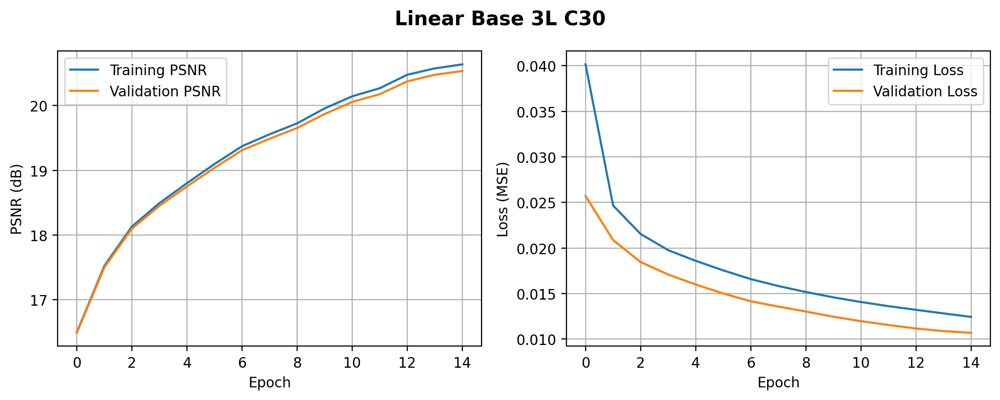

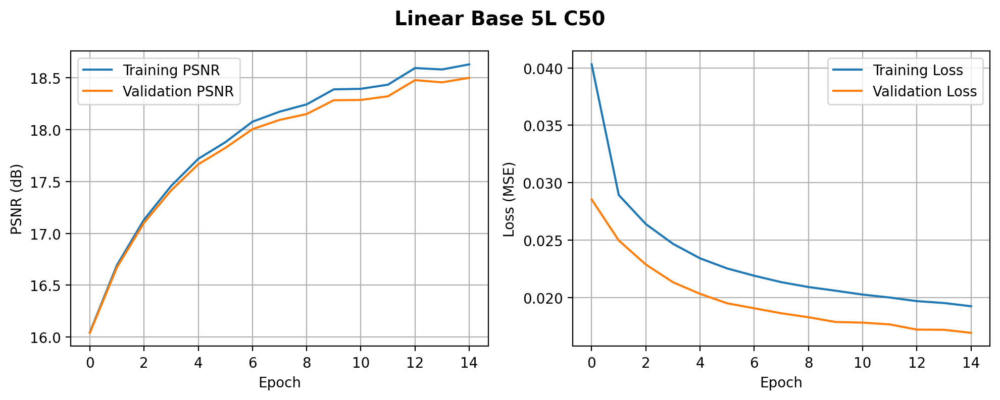

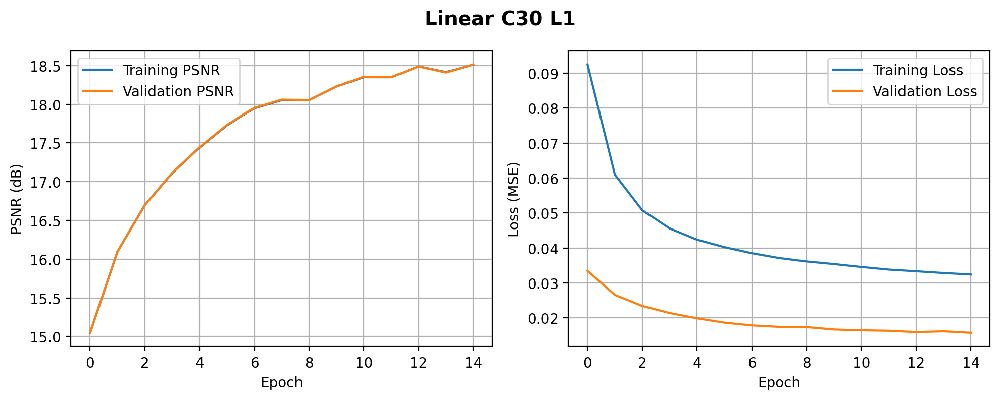

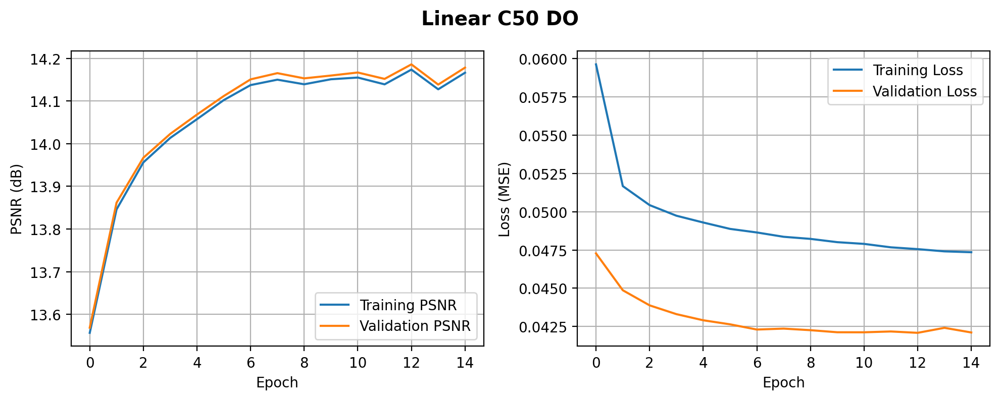


Early stopping activado en epoch 10. PSNR no mejoró por 3 épocas.


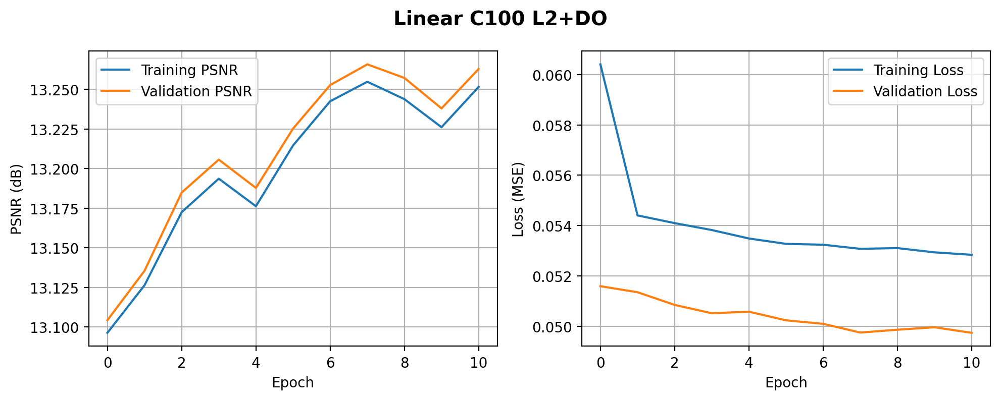

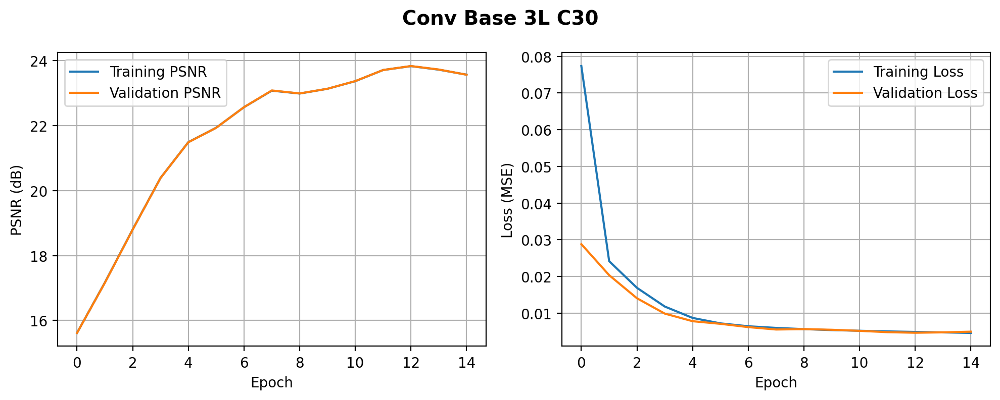

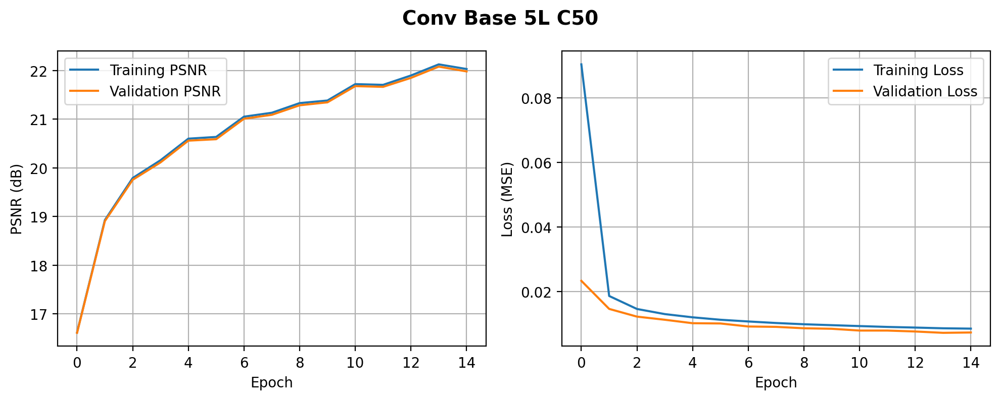

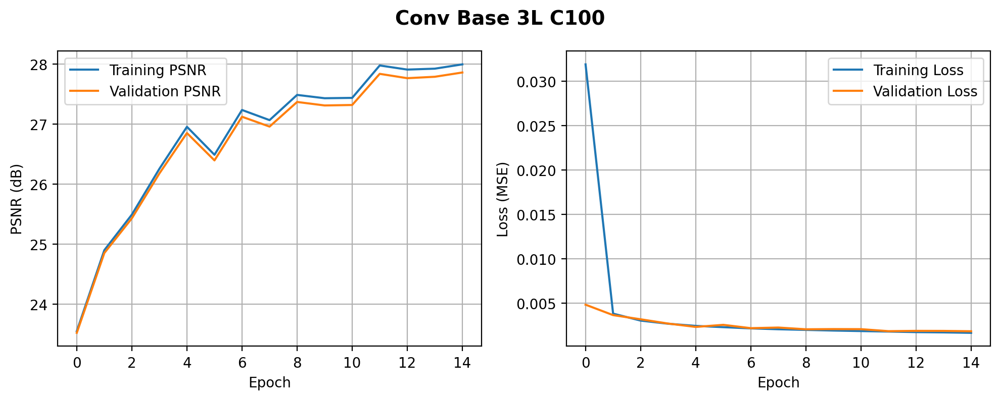

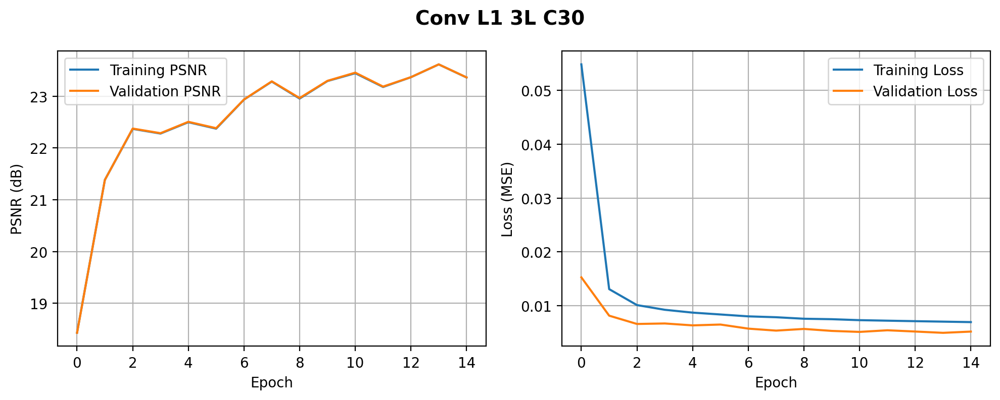


Early stopping activado en epoch 10. PSNR no mejoró por 3 épocas.


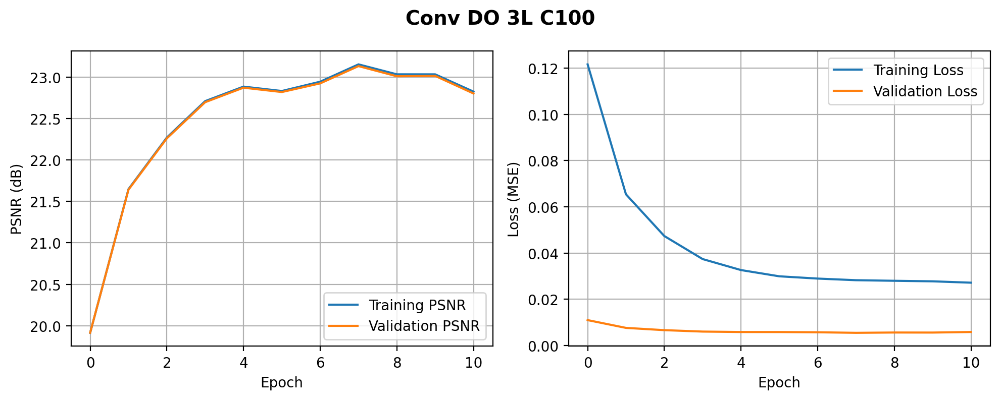

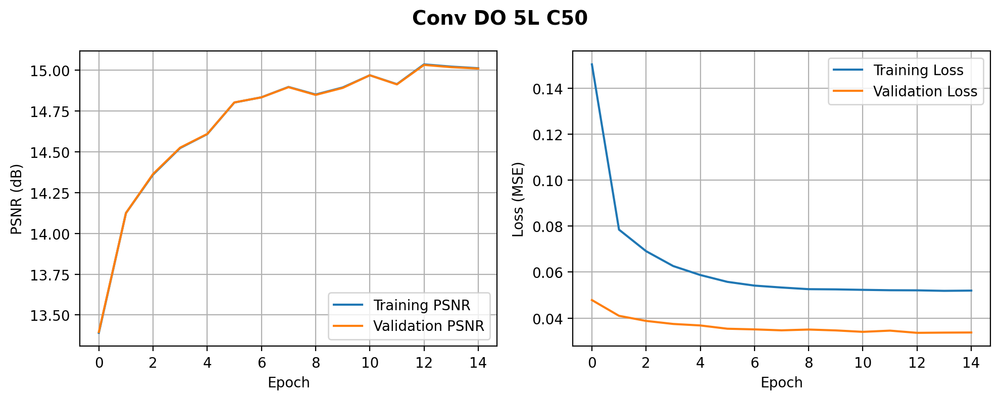

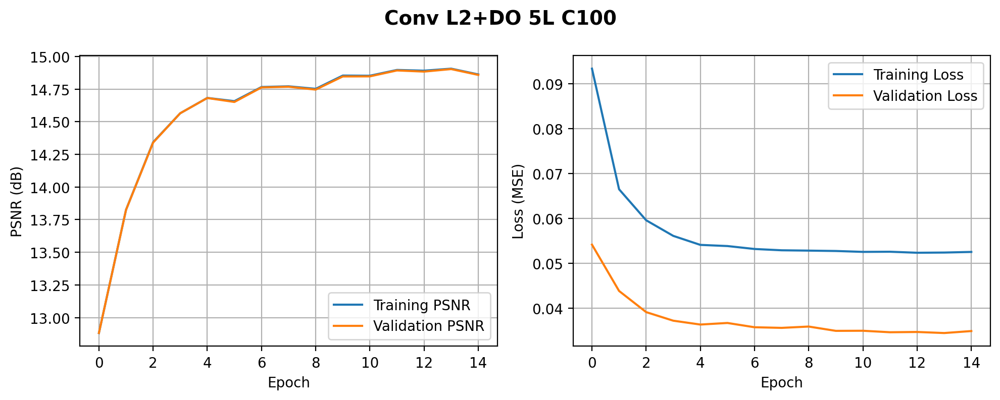

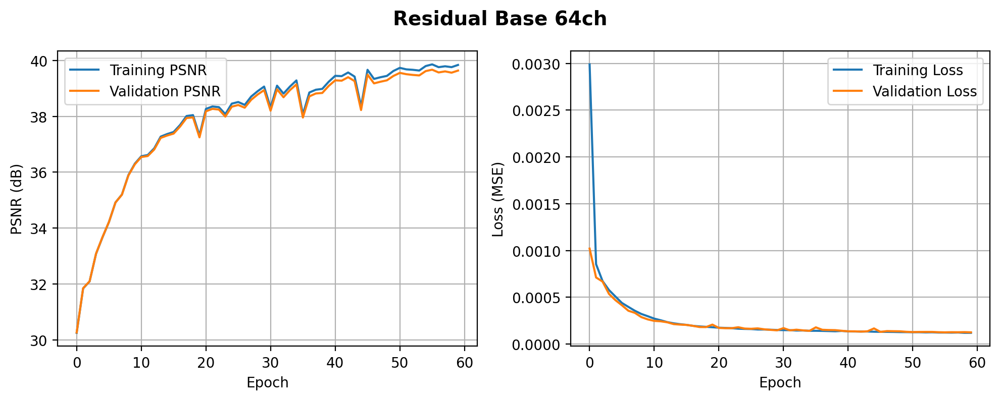

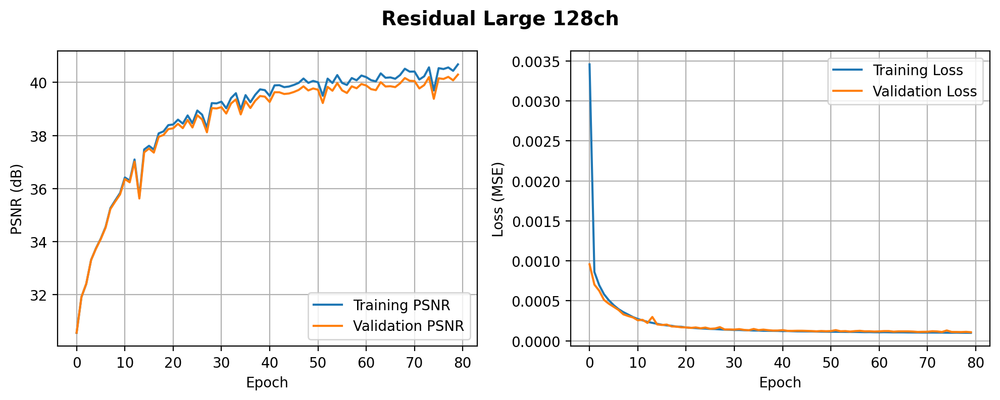


Early stopping activado en epoch 40. PSNR no mejoró por 9 épocas.


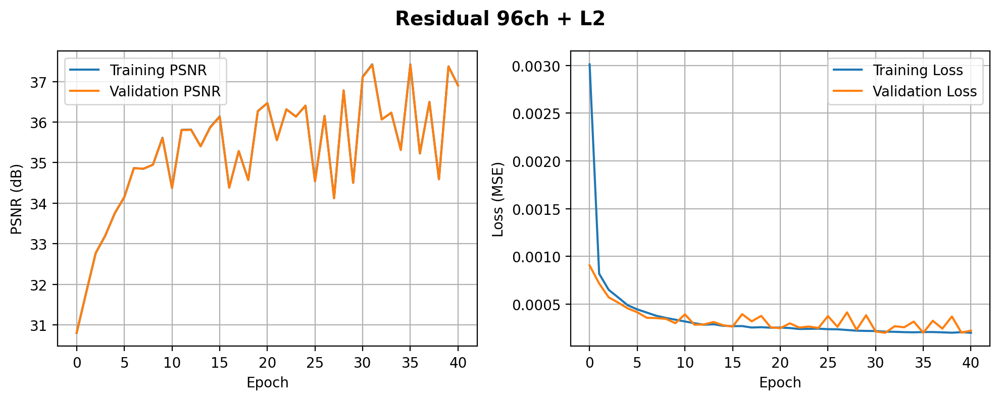

In [19]:
# Entrenar todos los modelos en MNIST
mnist_eval = train_eval_autoencoders(autoencoders_all, mnist_train_loader, mnist_valid_loader, mnist_test_loader)

Finalmente, mostramos los resultados de los modelos:

In [20]:
# Mostrar resultados de PSNR para cada modelo
print("Evaluación final en MNIST:")
display(mnist_eval.sort_values('PSNR', ascending=False))

Evaluación final en MNIST:


,PSNR
Residual Large 128ch,40.349504
Residual Base 64ch,39.674482
Residual 96ch + L2,36.945573
Conv Base 3L C100,27.892980
Conv Base 3L C30,23.649887
Conv L1 3L C30,23.456921
Conv DO 3L C100,22.882062
Conv Base 5L C50,22.085784
Linear Base 3L C30,20.633755
Linear C30 L1,18.604699


In [ ]:
# Hasta este punto, guardar todos los modelos entrenados
for name, model in autoencoders_all.items():
    torch.save(model.state_dict(), f"mnist_models/{name.replace(' ', '_')}_mnist_autoencoder.pth")

### **3.4. Entrenamiento y Evaluación sobre FMNIST**

De la misma manera, replicamos un proceso similar para Fashion-MNIST, a través de diferentes modelos lineales, convolucionales y residuales

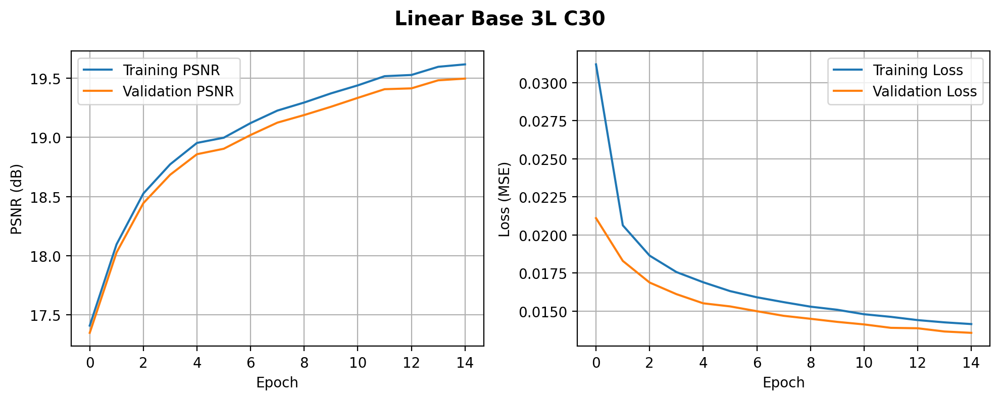

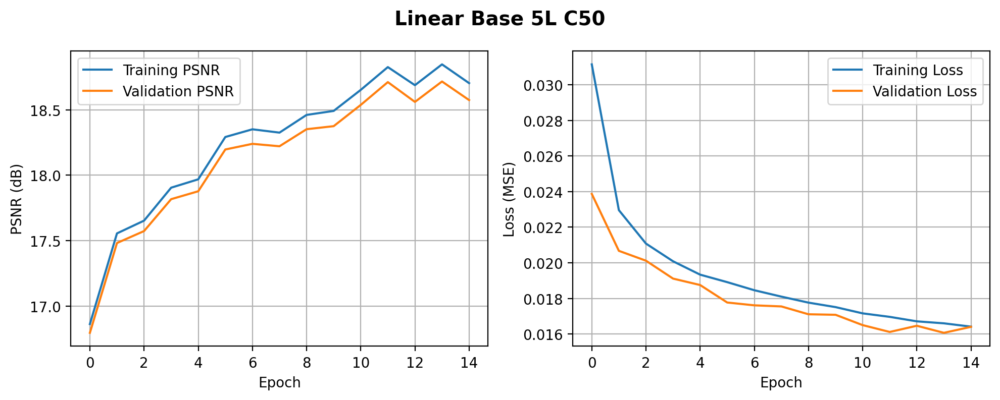

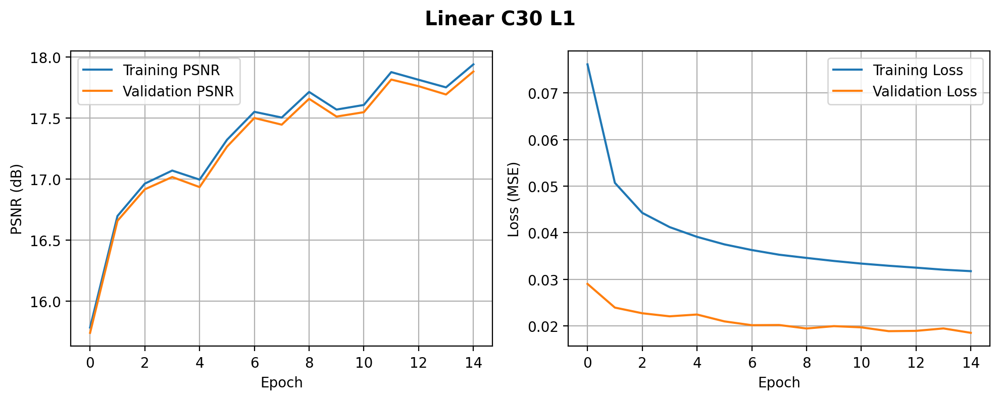


Early stopping activado en epoch 13. PSNR no mejoró por 3 épocas.


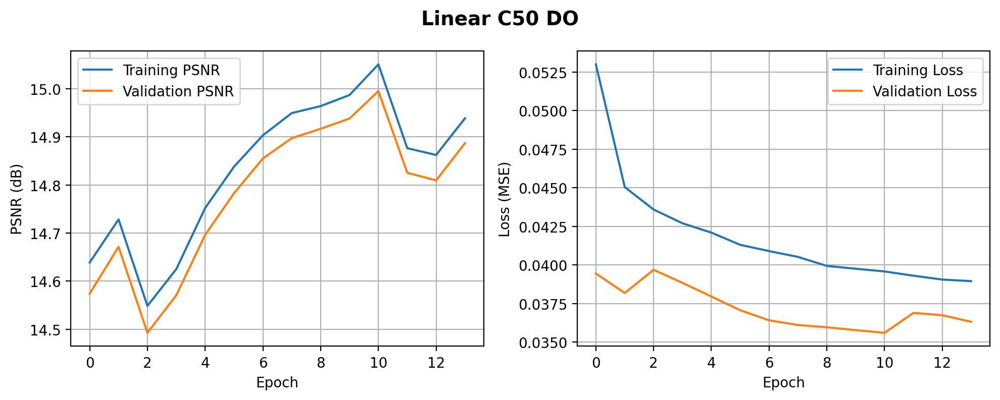


Early stopping activado en epoch 10. PSNR no mejoró por 3 épocas.


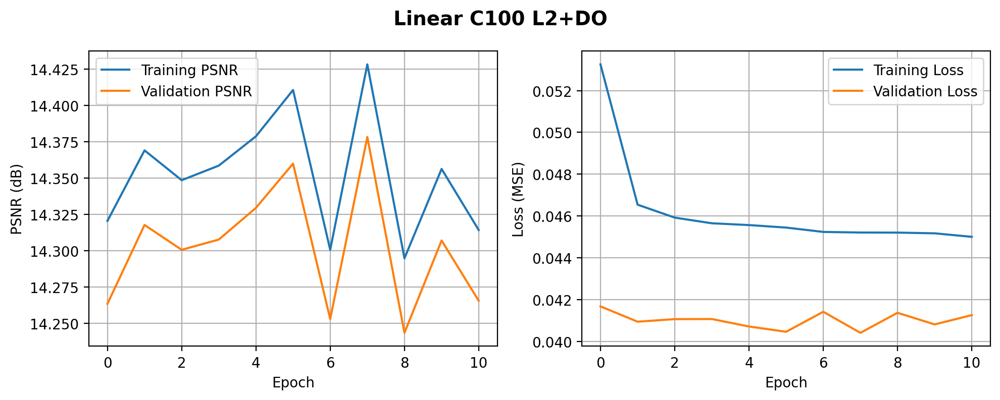

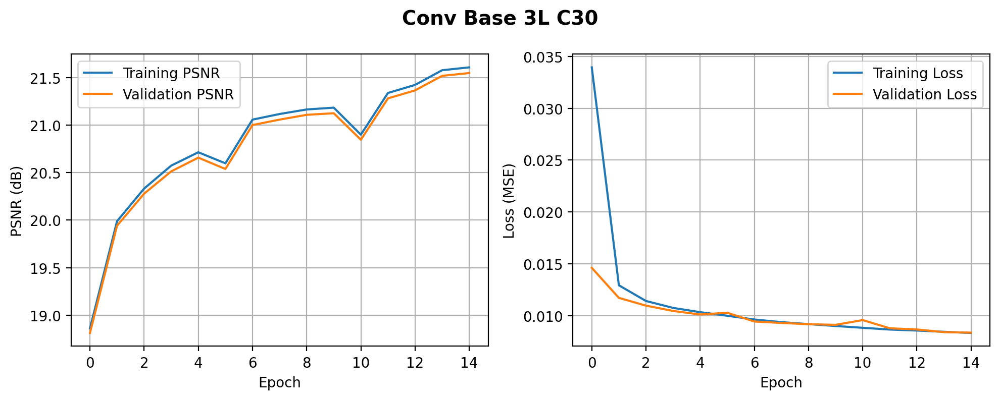

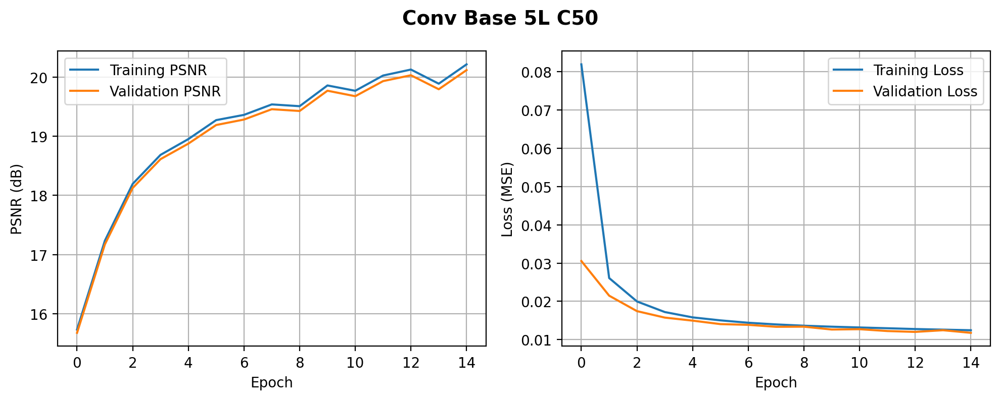

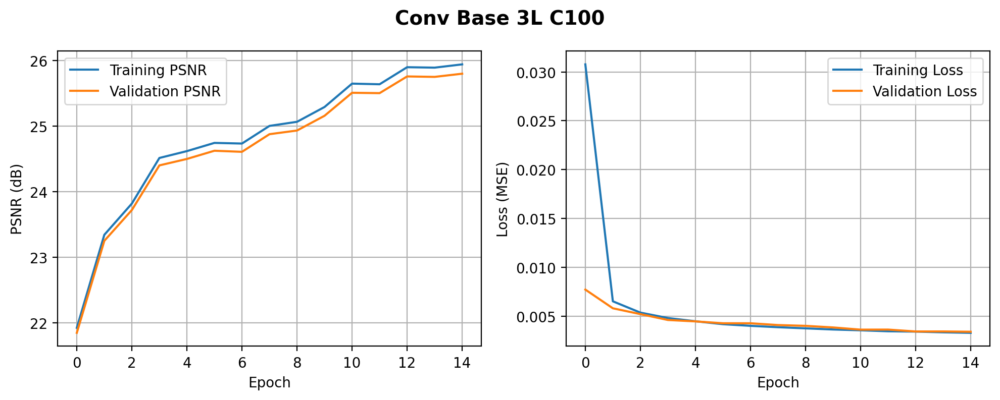


Early stopping activado en epoch 12. PSNR no mejoró por 3 épocas.


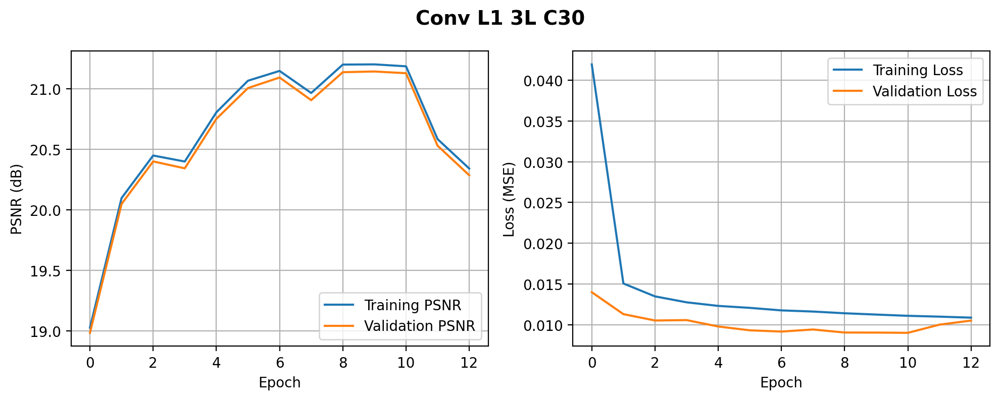


Early stopping activado en epoch 10. PSNR no mejoró por 3 épocas.


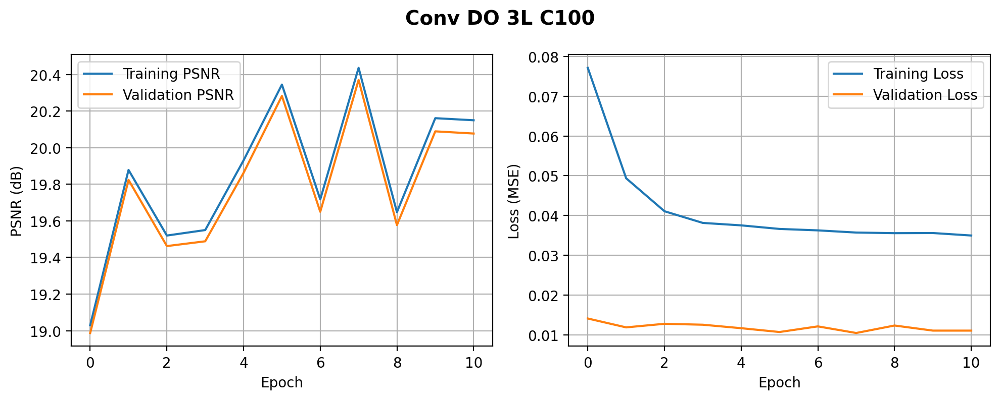

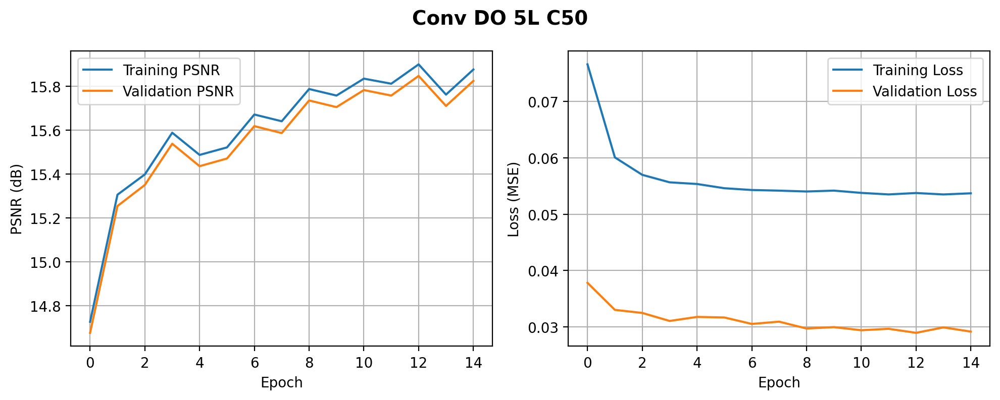


Early stopping activado en epoch 6. PSNR no mejoró por 3 épocas.


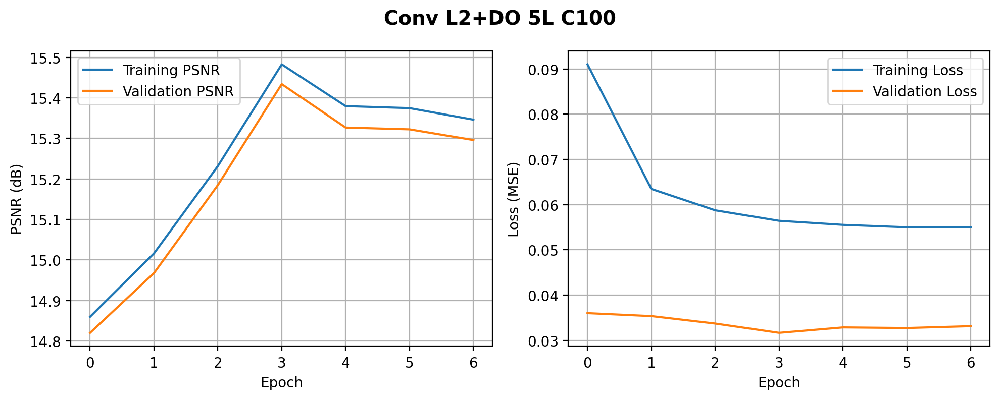


Early stopping activado en epoch 43. PSNR no mejoró por 8 épocas.


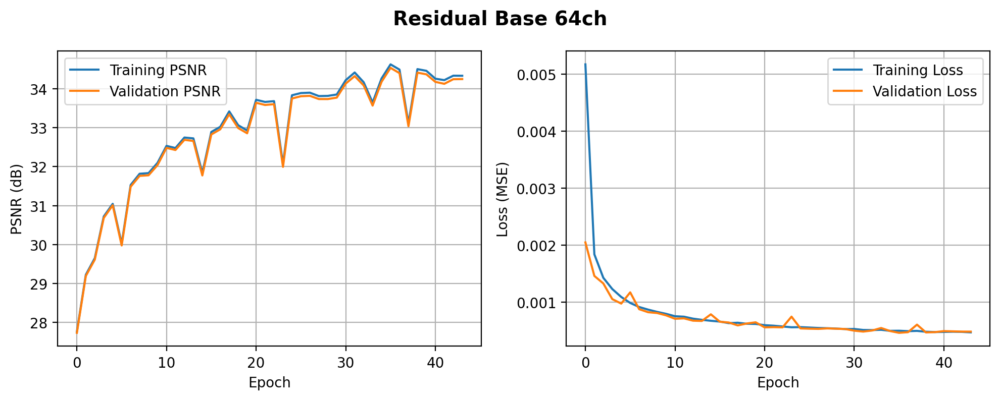


Early stopping activado en epoch 67. PSNR no mejoró por 10 épocas.


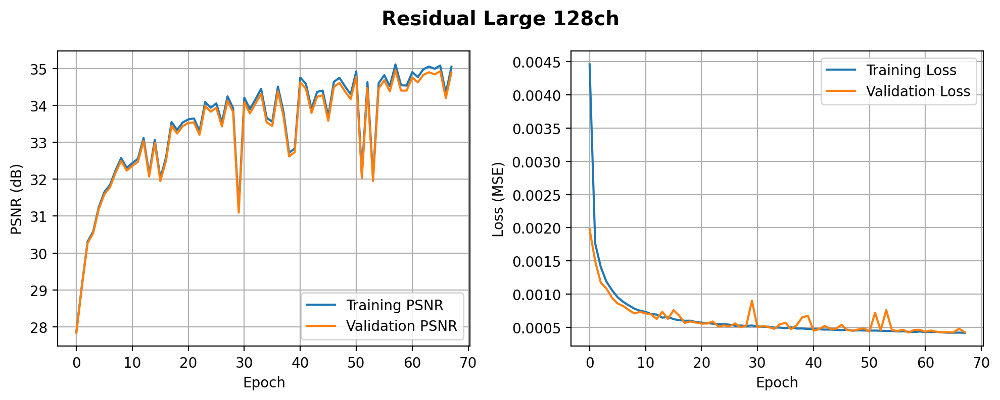


Early stopping activado en epoch 32. PSNR no mejoró por 9 épocas.


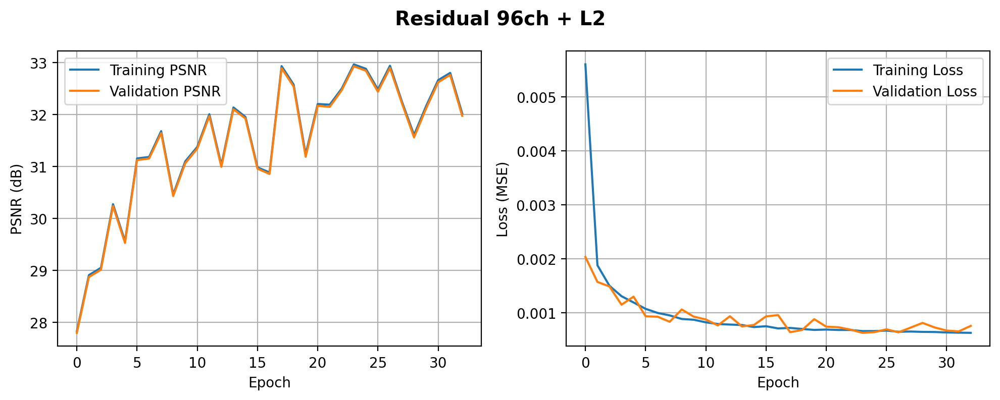

In [ ]:
# Entrenar todos los modelos en FMNIST (mismo procedimiento que MNIST)
autoencoders_linear_fmnist = {
    # Modelos base sin regularización
    'Linear Base 3L C30': LinealAutoencoder(n_layers=3, C=30),
    'Linear Base 5L C50': LinealAutoencoder(n_layers=5, C=50, hidden_size=HIDDEN_SIZE_5_LAYERS),
    
    # Modelo con regularización L1 (sparsity)
    'Linear C30 L1': LinealAutoencoder(n_layers=3, C=30, l1_lambda=L1_LAMBDA),
    
    # Modelo con dropout
    'Linear C50 DO': LinealAutoencoder(n_layers=5, C=50, hidden_size=HIDDEN_SIZE_5_LAYERS, dropout_p=DROPOUT_P),
    
    # Modelo con regularización combinada L2+Dropout
    'Linear C100 L2+DO': LinealAutoencoder(n_layers=5, C=100, hidden_size=HIDDEN_SIZE_5_LAYERS, weight_decay=L2_LAMBDA, dropout_p=DROPOUT_P),
}

autoencoders_conv_fmnist = {
    # Modelos base sin regularización
    'Conv Base 3L C30': ThreeLayersConvAutoencoder(C=30),
    'Conv Base 5L C50': FiveLayersConvAutoencoder(C=50),
    'Conv Base 3L C100': ThreeLayersConvAutoencoder(C=100),
    
    # Modelo con regularización L1 (sparsity)
    'Conv L1 3L C30': ThreeLayersConvAutoencoder(C=30, l1_lambda=L1_LAMBDA),
    
    # Modelo con dropout
    'Conv DO 3L C100': ThreeLayersConvAutoencoder(C=100, dropout_p=DROPOUT_P),
    'Conv DO 5L C50': FiveLayersConvAutoencoder(C=50, dropout_p=DROPOUT_P),
    
    # Modelo con regularización combinada L2+Dropout
    'Conv L2+DO 5L C100': FiveLayersConvAutoencoder(C=100, weight_decay=L2_LAMBDA, dropout_p=DROPOUT_P),
}

autoencoders_residual_fmnist = {
    'Residual Base 64ch': ResidualConvAutoencoder(
        latent_channels=64, latent_spatial=7, 
        epochs=60, lr=1e-3, patience=8
    ),
    'Residual Large 128ch': ResidualConvAutoencoder(
        latent_channels=128, latent_spatial=7,
        epochs=80, lr=8e-4, patience=10
    ),
    'Residual 96ch + L2': ResidualConvAutoencoder(
        latent_channels=96, latent_spatial=7,
        epochs=70, lr=9e-4, patience=9,
        weight_decay=1e-5
    ),
}

autoencoders_all_fmnist = {
    **autoencoders_linear_fmnist,
    **autoencoders_conv_fmnist,
    **autoencoders_residual_fmnist
}

fmnist_eval = train_eval_autoencoders(autoencoders_all_fmnist, fmnist_train_loader, fmnist_valid_loader, fmnist_test_loader)

In [46]:
# Mostrar resultados de PSNR para cada modelo
print("Resultados de evaluacion en FMNIST:")
display(fmnist_eval.sort_values('PSNR', ascending=False))

Resultados de evaluacion en FMNIST:


,PSNR
Residual Large 128ch,34.883730
Residual Base 64ch,34.242893
Residual 96ch + L2,31.972112
Conv Base 3L C100,25.811682
Conv Base 3L C30,21.560759
Conv L1 3L C30,20.312630
Conv Base 5L C50,20.126120
Conv DO 3L C100,20.098183
Linear Base 3L C30,19.509869
Linear Base 5L C50,18.592125


In [ ]:
# Guardar modelos entrenados en FMNIST hasta este punto
for name, model in autoencoders_all_fmnist.items():
    torch.save(model.state_dict(), f"fmnist_models/{name.replace(' ', '_')}_fmnist_autoencoder.pth")

### **3.5. *(Opcional)* Visualización de Reconstrucciones buenas vs. malas de ambos datasets**
Vamos a ver cómo de buenas son las reconstrucciones para los mejores modelos de cada dataset.

Para ello el formato será:
- Primera fila para imágenes originales
- Segunda fila para las mejores reconstrucciones
- Tercera fila para las peores

In [78]:
def show_comparison(autoencoders, evaluation, dataloader, num_images=5):
    """
    Muestra comparaciones entre imágenes originales y su mejor y peor reconstruccion
    """
    # Obtenemos el mejor y el peor modelo en terminos de PSNR
    best_autoencoder = autoencoders[evaluation['PSNR'].idxmax()]
    best_autoencoder.eval()
    worst_autoencoder = autoencoders[evaluation['PSNR'].idxmin()]
    worst_autoencoder.eval()

    # Obtenemos un batch de las imagenes de test
    dataiter = iter(dataloader)
    images, _ = next(dataiter)
    batch_size=64

    # Pasamos las imagenes y las etiquetas a gpu
    images_gpu = images.to(best_autoencoder.device)

    # Representacion latente del batch
    best_output, _ = best_autoencoder.forward(images_gpu)
    worst_output, _ = worst_autoencoder.forward(images_gpu)

    # Se ajusta la salida a un batch de imagenes
    best_output = best_output.view(batch_size, 1, 28, 28)
    worst_output = worst_output.view(batch_size, 1, 28, 28)

    # Movemos el resultado de vuelta a la cpu
    best_output = best_output.cpu().detach()
    worst_output = worst_output.cpu().detach()

    # Se imprimen las imagenes originales y las reconstrucciones de cada modelo
    fig, axes = plt.subplots(nrows=3, ncols=10, sharex=True, sharey=True, figsize=(25,4))
    fig.suptitle('Comparación entre representaciones buenas y malas', fontsize=16, fontweight='bold')

    # Primero las imagenes originales y luego las reconstrucciones
    for i in range(num_images):
        axes[0,i].imshow(images[i].squeeze(), cmap='gray')
        axes[1,i].imshow(best_output[i].squeeze(), cmap='gray')
        axes[2,i].imshow(worst_output[i].squeeze(), cmap='gray')

        # Elimina las leyendas
        axes[0,i].get_xaxis().set_visible(False)
        axes[0,i].get_yaxis().set_visible(False)
        axes[1,i].get_xaxis().set_visible(False)
        axes[1,i].get_yaxis().set_visible(False)
        axes[2,i].get_xaxis().set_visible(False)
        axes[2,i].get_yaxis().set_visible(False)

    # Titulos de las filas
    axes[0, 0].set_ylabel('Imágenes Originales', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel('Mejores Reconstrucciones', fontsize=12, fontweight='bold')
    axes[2, 0].set_ylabel('Peores Reconstrucciones', fontsize=12, fontweight='bold')

    # Vuelta a modo entrenamiento
    best_autoencoder.train()
    worst_autoencoder.train()

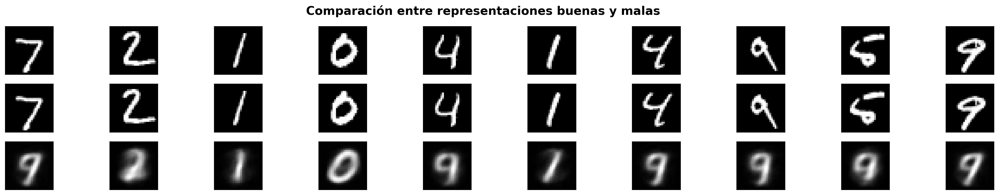

In [48]:
# Comparacion de reconstrucciones en MNIST
show_comparison(autoencoders=autoencoders_all, evaluation=mnist_eval, dataloader=mnist_test_loader, num_images=10)

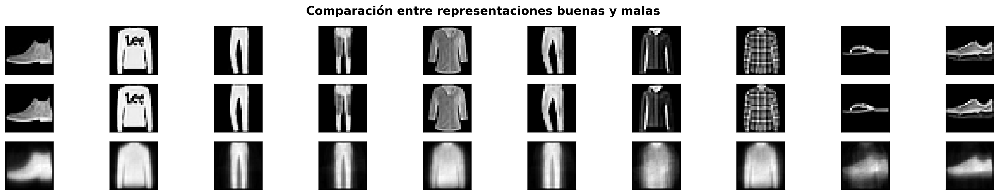

In [49]:
# Comparacion de reconstrucciones en FMNIST
show_comparison(autoencoders=autoencoders_all_fmnist, evaluation=fmnist_eval, dataloader=fmnist_test_loader, num_images=10)

## **4. Autoencoder para Denoising**

*(NO EJECUTAR SI ES TODO EN LA MISMA SESIÓN )Llegados a este punto, vamos a cargar los modelos dado que estas evaluaciones las hemos llevado a cabo en diferentes sesiones, para no reentrenar los modelos, donde especialmente los residuales han sido especialmente costosos computacionalmente de entrenar*

In [ ]:
### NO UTILIZAR DADO QUE SE ESTA CARGANDO EN LA MISMA SESION ###

# # Cargamos los modelos que guardamos anteriormente
# for name, model in autoencoders_all.items():
#     model.load_state_dict(torch.load(f"mnist_models/{name.replace(' ', '_')}_mnist_autoencoder.pth"))

# # y los de fmnist tambien
# for name, model in autoencoders_all_fmnist.items():
#     model.load_state_dict(torch.load(f"fmnist_models/{name.replace(' ', '_')}_fmnist_autoencoder.pth"))

En esta sección extendemos la mejor arquitectura encontrada (autoencoder residual con 128 canales) para abordar el problema de **denoising**. La tarea consiste en entrenar el modelo para reconstruir imágenes limpias a partir de versiones corrompidas con ruido gaussiano. Esto no solo evalúa la robustez del autoencoder, sino que también tiene aplicaciones prácticas en restauración de imágenes. Experimentamos con diferentes niveles de varianza del ruido (0.01, 0.04, 0.09) para observar cómo la intensidad del ruido afecta la capacidad de reconstrucción.

In [ ]:
# Esta clase hereda de la mejor arquitectura encontrada: ResidualConvAutoencoder con 128 canales
class DenoisingAutoencoder(ResidualConvAutoencoder):
  def __init__(self, latent_channels=128, latent_spatial=7, 
               epochs=80, lr=8e-4, patience=10, 
               variance=0.2, weight_decay=0.0, l1_lambda=0.0):

        # Hereda de ResidualConvAutoencoder con los parámetros del mejor modelo
        super().__init__(in_channels=1, 
                         latent_channels=latent_channels, 
                         latent_spatial=latent_spatial,
                         dropout_p=0.0, 
                         weight_decay=weight_decay, 
                         l1_lambda=l1_lambda, 
                         epochs=epochs,
                         lr=lr, 
                         patience=patience)

        self.variance = variance

  @staticmethod
  def add_gaussian_noise(images, variance):
    """
    Añade ruido gaussiano aditivo de media cero, controlando la intensidad mediante la varianza
    """
    # 1. Calcular la Desviación Estándar (sigma) a partir de la Varianza (sigma^2)
    # sigma = sqrt(variance)
    std_dev = torch.sqrt(torch.tensor(variance, dtype=images.dtype, device=images.device))

    # 2. Generar ruido con media 0 y desviación estándar 1 (Normal Estándar)
    noise = torch.randn_like(images)

    # 3. Ajustar la desviación estándar y añadir el ruido
    noisy_images = images + (std_dev * noise)

    # 4. Asegurar que los valores se mantengan entre 0 y 1
    noisy_images = torch.clamp(noisy_images, 0., 1.)

    return noisy_images

  # -----------------------------------------------------------
  # MÉTODOS DE ENTRENAMIENTO Y EVALUACIÓN
  # -----------------------------------------------------------

  def trainloop(self, trainloader, validloader):

      best_val_psnr = float('-inf') # Mejor PSNR es el valor más alto
      epochs_no_improve = 0
      best_model_state = None

      for e in range(int(self.epochs)):

          running_loss = 0.
          start_time = time.time()
          self.train()

          for images, _ in trainloader:

              labels = images # El autoencoder se entrena para reconstruir la entrada
              images, labels = images.to(self.device), labels.to(self.device)

              # Añade el ruido a las imagenes
              images = self.add_gaussian_noise(images, self.variance)

              self.optim.zero_grad()

              out, _ = self.forward(images)

              # Cálculo de la pérdida
              loss = self.criterion(out, labels)

              # Regularización L1 manual
              if self.l1_lambda > 0:
                  l1_norm = sum(p.abs().sum() for p in self.parameters())
                  loss = loss + self.l1_lambda * l1_norm

              running_loss += loss.item()

              loss.backward()
              self.optim.step()


          # Loss del entrenamiento
          train_loss = running_loss/len(trainloader)
          self.loss_during_training.append(train_loss)

          # Evaluacion con la metrica PSNR del entrenamiento
          train_psnr = self.eval_performance(trainloader)
          self.psnr_during_training.append(train_psnr)

          # Loss de la validacion
          val_loss = self.eval_loss(validloader)
          self.valid_loss_during_training.append(val_loss)

          # Evaluación con la métrica PSNR de la validacion
          val_psnr = self.eval_performance(validloader)
          self.valid_psnr_during_training.append(val_psnr)

          time_per_epoch = time.time() - start_time

          # Early Stopping (basado en PSNR)
          if val_psnr > best_val_psnr:
              best_val_psnr = val_psnr
              epochs_no_improve = 0
              best_model_state = self.state_dict()
          else:
              epochs_no_improve += 1
              if epochs_no_improve >= self.patience:
                  print(f"\nEarly stopping activado en epoch {e}. PSNR no mejoró por {self.patience} épocas.")
                  if best_model_state:
                      self.load_state_dict(best_model_state)
                  break


  def eval_loss(self, dataloader):
      """
      Función de Evaluación de Pérdida
      """
      self.eval() # Cambia a modo evaluación
      running_loss = 0

      with torch.no_grad():
          for images, labels in dataloader:
              labels = images

              images, labels = images.to(self.device), labels.to(self.device)

              # Añade el ruido a las imagenes
              images = self.add_gaussian_noise(images, self.variance)

              out = self.forward(images)[0]

              loss =  self.criterion(out, labels)

              running_loss += loss.item()

      self.train() # Cambia a modo entrenamiento
      return running_loss/len(dataloader)


  def eval_performance(self, dataloader):
      """
      Función de Evaluación de Rendimiento: Calcula el PSNR promedio.
      """
      self.eval() # Cambia a modo evaluacion
      running_psnr = 0
      batch_count = 0

      with torch.no_grad():
          for images, _ in dataloader:
              labels = images

              images, labels = images.to(self.device), labels.to(self.device)

              # Añade el ruido a las imagenes
              images = self.add_gaussian_noise(images, self.variance)

              out, _ = self.forward(images) # Reconstrucción

              # Cálculo del PSNR: compara la imagen original con la reconstruida
              psnr = self.calculate_psnr(labels, out)

              running_psnr += psnr
              batch_count += 1

      self.train() # Cambia de nuevo al modo entrenamiento
      return running_psnr / batch_count

### *Evaluación sobre MNIST*

Entrenamos y evaluamos tres modelos de denoising sobre MNIST, cada uno con diferentes niveles de ruido gaussiano. Los modelos con mayor ruido requieren más épocas y un learning rate más bajo para converger adecuadamente.

In [27]:
# Se crean los modelos con hiperparámetros ajustados para denoising
# Aumentamos épocas y paciencia porque el ruido hace más difícil la convergencia
denoising_autoencoders_mnist = {
    'Denoising Var=0.01': DenoisingAutoencoder(
        variance=0.01, 
        latent_channels=128,
        epochs=40, 
        lr=5e-4,  # LR más bajo para estabilidad con ruido
        patience=15
    ),
    'Denoising Var=0.04': DenoisingAutoencoder(
        variance=0.04,
        latent_channels=128,
        epochs=40,
        lr=5e-4,
        patience=15
    ),
    'Denoising Var=0.09': DenoisingAutoencoder(
        variance=0.09,
        latent_channels=128,
        epochs=60,
        lr=4e-4,  # Aún más bajo para ruido alto
        patience=20
    ),
}

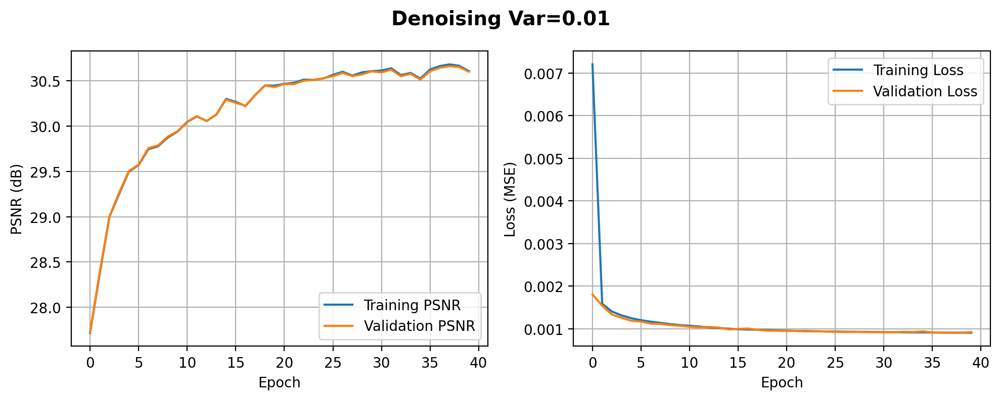

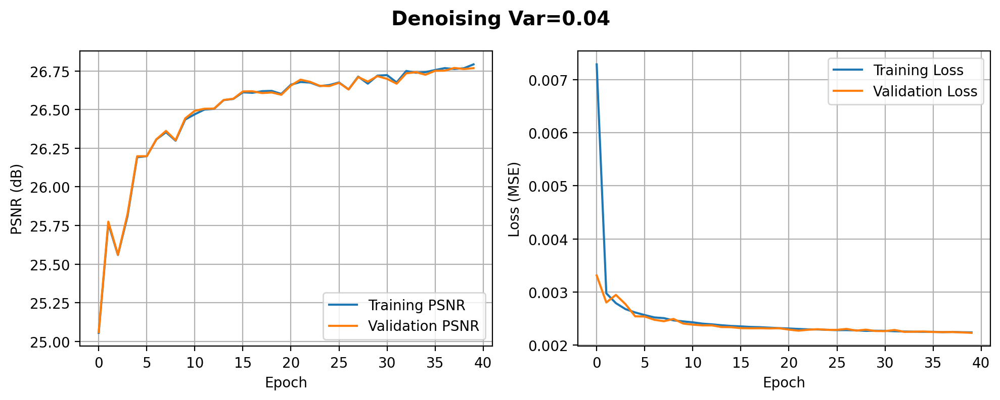

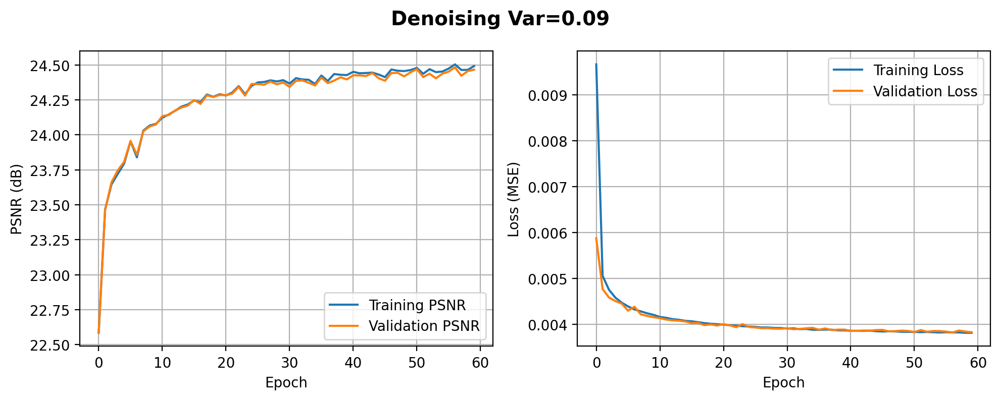

In [28]:
# Se entrenan y evaluan los modelos sobre MNIST
mnist_denoising_eval = train_eval_autoencoders(denoising_autoencoders_mnist, mnist_train_loader, mnist_valid_loader, mnist_test_loader)

In [38]:
# Guardar los modelos entrenados de denoising en MNIST
for name, model in denoising_autoencoders_mnist.items():
    torch.save(model.state_dict(), f"mnist_denoising_models/{name.replace(' ', '_')}_mnist_denoising_autoencoder.pth")

In [29]:
# Se muestran los resultados de PSNR para cada modelo
display(mnist_denoising_eval)

,PSNR
Denoising Var=0.01,30.610611
Denoising Var=0.04,26.764387
Denoising Var=0.09,24.471526


Mostramos la comparación visual, donde:

- La primera fila se corresponde a la imagen original
- La segunda fila se corresponde a la de las imagenes contaminadas con ruido
- La tercera fila es la construcción de la imagen a través del *denoising*

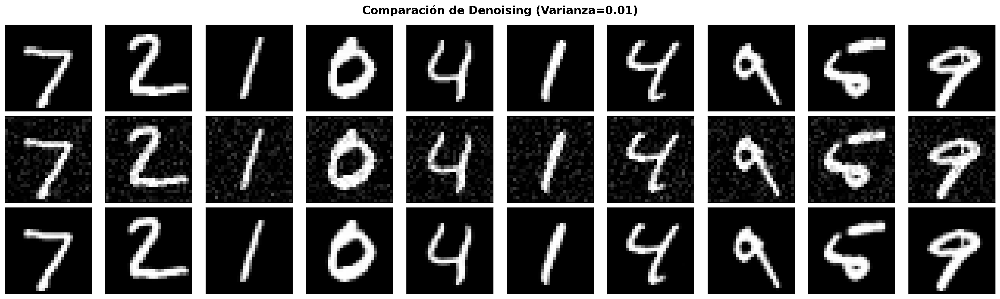

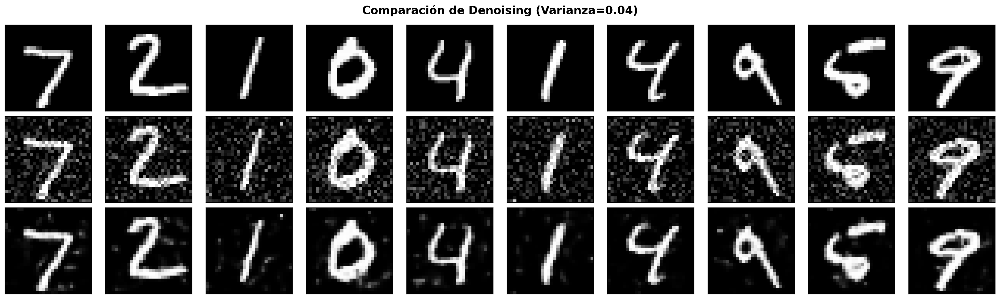

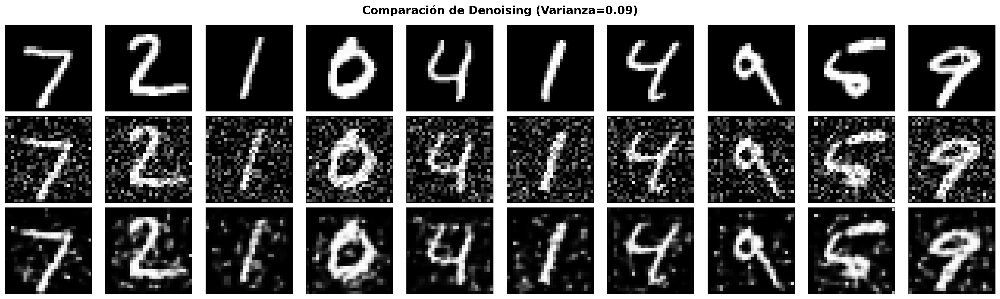

In [ ]:
def show_denoising_comparison(autoencoders, evaluation, dataloader, variance, num_images=5):
    """
    Muestra comparaciones entre imágenes originales, ruidosas y sus reconstrucciones
    """
    # Obtenemos el mejor modelo en terminos de PSNR
    best_autoencoder = autoencoders[evaluation['PSNR'].idxmax()]
    best_autoencoder.eval()

    # Obtenemos un batch de las imagenes de test
    dataiter = iter(dataloader)
    images, _ = next(dataiter)
    batch_size = images.size(0)  # Usar el tamaño real del batch

    # Pasamos las imagenes a gpu
    images_gpu = images.to(best_autoencoder.device)

    # Creamos las imagenes ruidosas
    noisy_images_gpu = DenoisingAutoencoder.add_gaussian_noise(images_gpu, variance)

    # Representacion latente del batch
    best_output, _ = best_autoencoder.forward(noisy_images_gpu)

    if best_output.dim() == 2:
        best_output = best_output.view(batch_size, 1, 28, 28)

    best_output = best_output.cpu().detach()

    # Se imprimen las imagenes originales, ruidosas y las reconstrucciones
    fig, axes = plt.subplots(nrows=3, ncols=num_images, sharex=True, sharey=True, figsize=(20,6))
    fig.suptitle(f'Comparación de Denoising (Varianza={variance})', fontsize=16, fontweight='bold')

    for i in range(num_images):
        axes[0,i].imshow(images[i].squeeze(), cmap='gray')
        axes[1,i].imshow(noisy_images_gpu[i].cpu().squeeze(), cmap='gray')
        axes[2,i].imshow(best_output[i].squeeze(), cmap='gray')

        # Elimina las leyendas
        axes[0,i].get_xaxis().set_visible(False)
        axes[0,i].get_yaxis().set_visible(False)
        axes[1,i].get_xaxis().set_visible(False)
        axes[1,i].get_yaxis().set_visible(False)
        axes[2,i].get_xaxis().set_visible(False)
        axes[2,i].get_yaxis().set_visible(False)

    # Titulos de las filas
    axes[0, 0].set_ylabel('Imágenes Originales', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel('Imágenes Ruidosas', fontsize=12, fontweight='bold')
    axes[2, 0].set_ylabel('Reconstrucciones', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # Vuelta a modo entrenamiento
    best_autoencoder.train()

# Mostramos las comparaciones para cada nivel de ruido
for variance in [0.01, 0.04, 0.09]:
    show_denoising_comparison(
        autoencoders=denoising_autoencoders_mnist, 
        evaluation=mnist_denoising_eval, 
        dataloader=mnist_test_loader, 
        variance=variance,
        num_images=10
    )

### *Evaluación sobre FMNIST*

Repetimos el experimento de denoising sobre Fashion MNIST. Dado que este dataset es más complejo, ajustamos los hiperparámetros para compensar la mayor dificultad: aumentamos las épocas de entrenamiento y reducimos ligeramente el learning rate. Usamos sólo una varianza intermedia de 0.04 para mostrar como funciona en este dataset dado el tiempo que lleva en entrenar este tipo de autoencoders residuales.

In [41]:
# FMNIST es más complejo de entrenar, por lo que usamos una varianza intermedia a modo de comparativa con MNIST
denoising_autoencoders_fmnist = {
    'Denoising Var=0.04': DenoisingAutoencoder(
        variance=0.04,
        latent_channels=50,
        epochs=60,
        lr=4e-4,
        patience=20
    ),
}

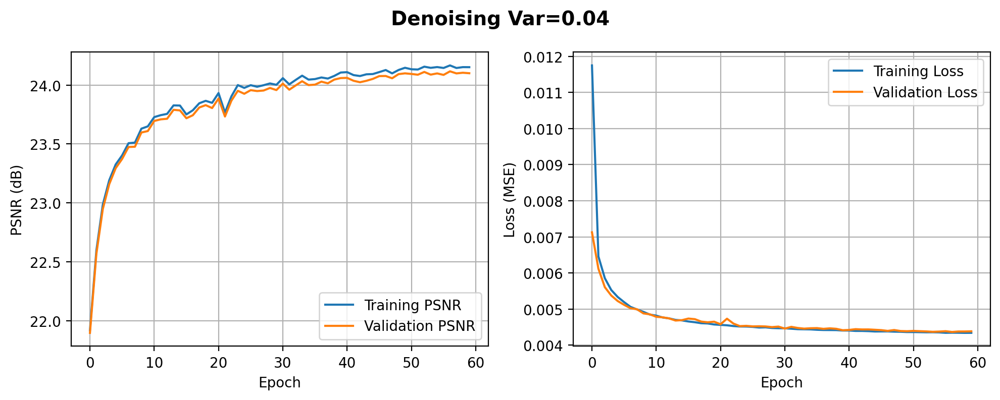

,PSNR
Denoising Var=0.04,24.075386


In [42]:
# Se entrenan y evaluan los modelos sobre FMNIST
fmnist_denoising_eval = train_eval_autoencoders(denoising_autoencoders_fmnist, fmnist_train_loader, fmnist_valid_loader, fmnist_test_loader)

# Se muestran los resultados de PSNR para cada modelo
display(fmnist_denoising_eval)

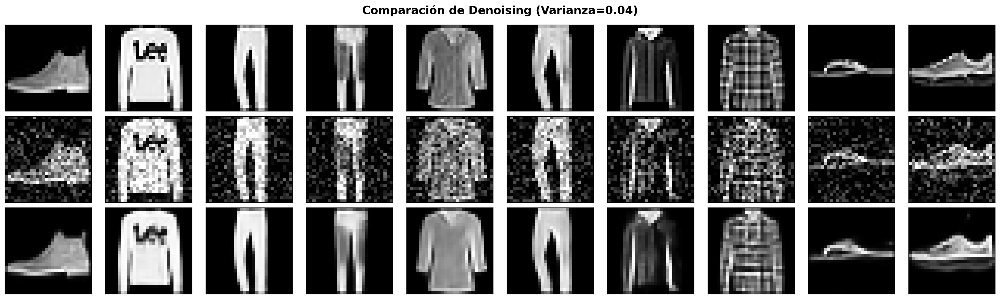

In [43]:
# Mostrar reconstrucciones en FMNIST
show_denoising_comparison(
    autoencoders=denoising_autoencoders_fmnist, 
    evaluation=fmnist_denoising_eval, 
    dataloader=fmnist_test_loader, 
    variance=0.04,
    num_images=10
)

In [44]:
# Y guardamos el modelo entrenado de denoising en FMNIST
for name, model in denoising_autoencoders_fmnist.items():
    torch.save(model.state_dict(), f"fmnist_denoising_models/{name.replace(' ', '_')}_fmnist_denoising_autoencoder.pth")

## **5. Experimentos Adicionales**

Esta sección reúne una serie de experimentos adicionales diseñados para profundizar en el comportamiento y las capacidades de los autoencoders. Incluye estudios sobre el impacto del tamaño del dataset en el rendimiento, comparaciones de representaciones entre modelos buenos y malos, análisis de transferencia de aprendizaje entre datasets, y exploración del espacio latente como herramienta de generación.

### **5.1 Entrenamiento con diferentes tamaños de dataset**

En este experimento exploramos cómo el tamaño del dataset de entrenamiento afecta el rendimiento de los autoencoders. Entrenaremos los mejores modelos de cada tipo con diferentes porcentajes del dataset (10%, 25%, 50%, 75% y 100%) para observar la relación entre cantidad de datos y calidad de reconstrucción.

In [45]:
# Función para crear subsets de diferentes tamaños
def create_subset_loaders(train_data, train_size_percentage, batch_size=64):
    """
    Crea dataloaders con diferentes porcentajes del dataset de entrenamiento
    Args:
        train_data: Dataset completo de entrenamiento
        train_size_percentage: Porcentaje del dataset a usar (0-100)
        batch_size: Tamaño del batch
    Returns:
        train_loader, valid_loader con el porcentaje especificado
    """
    # Calcular tamaño total a usar
    total_size = int(len(train_data) * train_size_percentage / 100)
    
    # Split train/validation (80/20 del subset)
    train_size = int(0.8 * total_size)
    valid_size = total_size - train_size
    unused_size = len(train_data) - total_size
    
    # Crear subsets
    train_subset, valid_subset, _ = random_split(
        train_data, 
        [train_size, valid_size, unused_size],
        generator=torch.Generator().manual_seed(42)  # Reproducibilidad
    )
    
    # Crear dataloaders
    train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, num_workers=2)
    valid_loader = DataLoader(valid_subset, batch_size=batch_size, shuffle=False, num_workers=2)
    
    return train_loader, valid_loader


# Función para entrenar y evaluar con diferentes tamaños de dataset
def experiment_dataset_sizes(model_configs, train_data, test_loader, dataset_sizes=[10, 25, 50, 75, 100]):
    """
    Entrena modelos con diferentes porcentajes del dataset
    Args:
        model_configs: Diccionario {nombre: función_creadora_modelo}
        train_data: Dataset completo de entrenamiento
        test_loader: DataLoader de test
        dataset_sizes: Lista de porcentajes a probar
    Returns:
        DataFrame con resultados PSNR por modelo y tamaño de dataset
    """
    results = {size: {} for size in dataset_sizes}
    
    for size_pct in dataset_sizes:
        print(f"\n{'='*70}")
        print(f"ENTRENANDO CON {size_pct}% DEL DATASET ({int(len(train_data) * size_pct / 100)} muestras)")
        print(f"{'='*70}\n")
        
        # Crear dataloaders para este tamaño
        train_loader, valid_loader = create_subset_loaders(train_data, size_pct)
        
        for model_name, model_creator in model_configs.items():
            print(f"\nModelo: {model_name}")
            
            # Crear nuevo modelo
            model = model_creator()
            
            # Entrenar
            model.trainloop(train_loader, valid_loader)
            
            # Evaluar en test
            test_psnr = model.eval_performance(test_loader)
            results[size_pct][model_name] = test_psnr
            
            print(f"  Test PSNR: {test_psnr:.2f} dB")
    
    # Convertir resultados a DataFrame
    df = pd.DataFrame(results).T
    df.index.name = 'Dataset Size (%)'
    
    return df

In [46]:
# Configuración de los mejores modelos para el experimento
# Usamos funciones lambda para crear modelos frescos en cada iteración

best_models_config = {
    # Mejor modelo lineal (según resultados anteriores)
    'Linear Best': lambda: LinealAutoencoder(
        n_layers=5, 
        C=100, 
        hidden_size=HIDDEN_SIZE_5_LAYERS, 
        weight_decay=L2_LAMBDA, 
        dropout_p=DROPOUT_P,
        epochs=50,  # Reducimos épocas para experimento más rápido
        patience=8
    ),
    
    # Mejor modelo convolucional (según resultados anteriores)
    'Conv Best': lambda: ThreeLayersConvAutoencoder(
        C=50, 
        l1_lambda=L1_LAMBDA, 
        weight_decay=L2_LAMBDA,
        epochs=50,
        patience=8
    ),
    
    # Mejor modelo residual (según resultados anteriores)
    'Residual Best': lambda: ResidualConvAutoencoder(
        latent_channels=128, 
        latent_spatial=7,
        epochs=60,
        lr=8e-4, 
        patience=10
    ),
}

In [47]:
# Ejecutar experimento con diferentes tamaños de dataset en MNIST
print("EXPERIMENTO: Impacto del tamaño del dataset en MNIST\n")

mnist_size_results = experiment_dataset_sizes(
    model_configs=best_models_config,
    train_data=mnist_train_data,
    test_loader=mnist_test_loader,
    dataset_sizes=[10, 25, 50, 75, 100]  # Porcentajes del dataset
)

print("\n" + "="*70)
print("RESULTADOS FINALES - MNIST")
print("="*70)
display(mnist_size_results)

EXPERIMENTO: Impacto del tamaño del dataset en MNIST


ENTRENANDO CON 10% DEL DATASET (6000 muestras)


Modelo: Linear Best

Early stopping activado en epoch 31. PSNR no mejoró por 8 épocas.
  Test PSNR: 13.17 dB

Modelo: Conv Best
  Test PSNR: 24.26 dB

Modelo: Residual Best
  Test PSNR: 33.69 dB

ENTRENANDO CON 25% DEL DATASET (15000 muestras)


Modelo: Linear Best

Early stopping activado en epoch 14. PSNR no mejoró por 8 épocas.
  Test PSNR: 13.19 dB

Modelo: Conv Best

Early stopping activado en epoch 45. PSNR no mejoró por 8 épocas.
  Test PSNR: 23.17 dB

Modelo: Residual Best
  Test PSNR: 36.67 dB

ENTRENANDO CON 50% DEL DATASET (30000 muestras)


Modelo: Linear Best

Early stopping activado en epoch 27. PSNR no mejoró por 8 épocas.
  Test PSNR: 13.32 dB

Modelo: Conv Best

Early stopping activado en epoch 21. PSNR no mejoró por 8 épocas.
  Test PSNR: 23.66 dB

Modelo: Residual Best
  Test PSNR: 38.83 dB

ENTRENANDO CON 75% DEL DATASET (45000 muestras)


Modelo: Linear Best

Ear

,Linear Best,Conv Best,Residual Best
Dataset Size (%),,,
10,13.171005,24.264316,33.693741
25,13.194605,23.165915,36.666809
50,13.323826,23.660157,38.832780
75,13.369536,23.425508,39.542028
100,13.371027,24.136447,39.886118


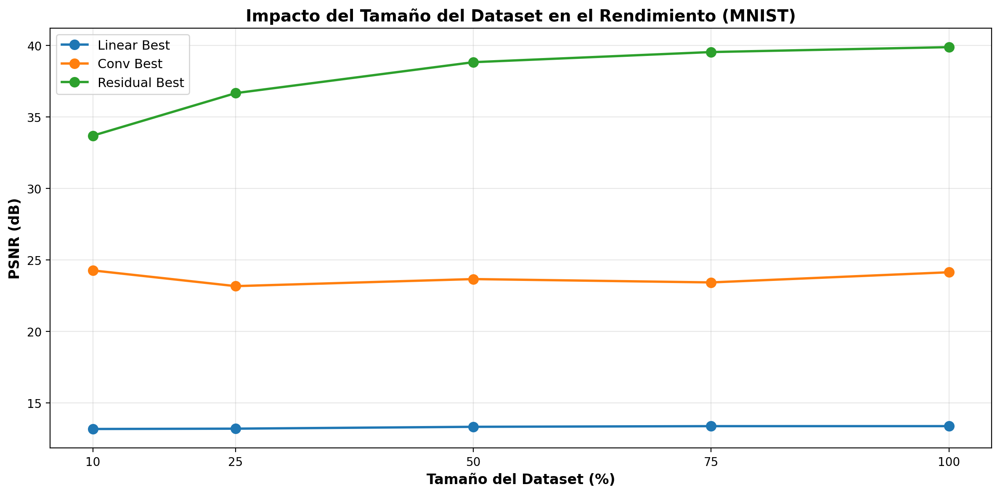


MEJORA ABSOLUTA (dB) desde 10% hasta 100% del dataset:
  Linear Best: +0.20 dB
  Conv Best: -0.13 dB
  Residual Best: +6.19 dB


In [48]:
# Visualización de resultados: Gráfica de PSNR vs Tamaño del Dataset
fig, ax = plt.subplots(figsize=(12, 6))

for model_name in mnist_size_results.columns:
    ax.plot(mnist_size_results.index, 
            mnist_size_results[model_name], 
            marker='o', 
            linewidth=2, 
            markersize=8,
            label=model_name)

ax.set_xlabel('Tamaño del Dataset (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('PSNR (dB)', fontsize=12, fontweight='bold')
ax.set_title('Impacto del Tamaño del Dataset en el Rendimiento (MNIST)', 
             fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
ax.set_xticks(mnist_size_results.index)

plt.tight_layout()
plt.show()

# Análisis de mejora relativa
print("\nMEJORA ABSOLUTA (dB) desde 10% hasta 100% del dataset:")
for model_name in mnist_size_results.columns:
    improvement = mnist_size_results[model_name].iloc[-1] - mnist_size_results[model_name].iloc[0]
    print(f"  {model_name}: {improvement:+.2f} dB")

In [49]:
# Ejecutar el mismo experimento en Fashion-MNIST
print("\n" + "="*70)
print("EXPERIMENTO: Impacto del tamaño del dataset en Fashion-MNIST")
print("="*70 + "\n")

fmnist_size_results = experiment_dataset_sizes(
    model_configs=best_models_config,
    train_data=fmnist_train_data,
    test_loader=fmnist_test_loader,
    dataset_sizes=[10, 25, 50, 75, 100]
)

print("\n" + "="*70)
print("RESULTADOS FINALES - Fashion-MNIST")
print("="*70)
display(fmnist_size_results)


EXPERIMENTO: Impacto del tamaño del dataset en Fashion-MNIST


ENTRENANDO CON 10% DEL DATASET (6000 muestras)


Modelo: Linear Best

Early stopping activado en epoch 28. PSNR no mejoró por 8 épocas.
  Test PSNR: 14.35 dB

Modelo: Conv Best
  Test PSNR: 21.80 dB

Modelo: Residual Best
  Test PSNR: 30.24 dB

ENTRENANDO CON 25% DEL DATASET (15000 muestras)


Modelo: Linear Best

Early stopping activado en epoch 29. PSNR no mejoró por 8 épocas.
  Test PSNR: 14.40 dB

Modelo: Conv Best

Early stopping activado en epoch 36. PSNR no mejoró por 8 épocas.
  Test PSNR: 21.51 dB

Modelo: Residual Best
  Test PSNR: 32.67 dB

ENTRENANDO CON 50% DEL DATASET (30000 muestras)


Modelo: Linear Best

Early stopping activado en epoch 38. PSNR no mejoró por 8 épocas.
  Test PSNR: 14.45 dB

Modelo: Conv Best

Early stopping activado en epoch 35. PSNR no mejoró por 8 épocas.
  Test PSNR: 21.86 dB

Modelo: Residual Best

Early stopping activado en epoch 50. PSNR no mejoró por 10 épocas.
  Test PSNR: 33.60 d

,Linear Best,Conv Best,Residual Best
Dataset Size (%),,,
10,14.346644,21.795268,30.244863
25,14.404315,21.506145,32.670195
50,14.445096,21.858850,33.603485
75,14.282649,20.612422,34.040381
100,14.525758,21.584669,34.580023


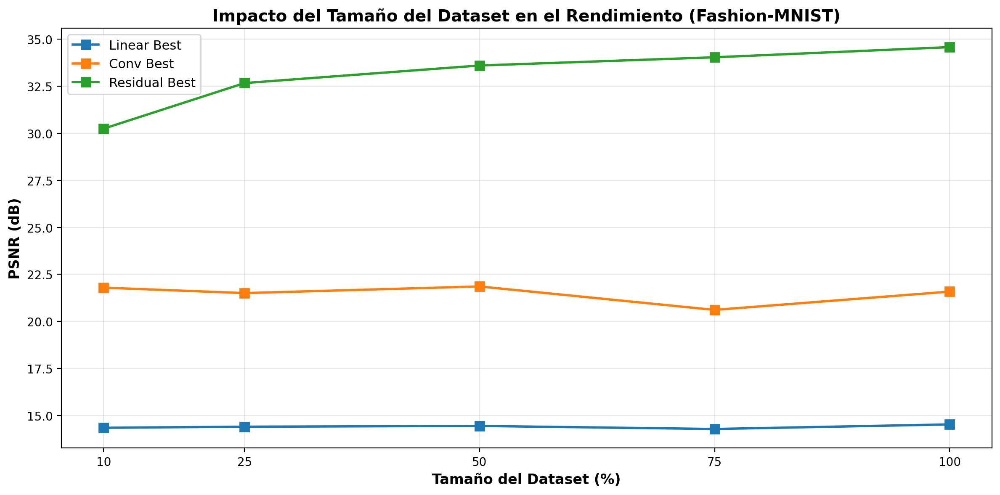


MEJORA ABSOLUTA (dB) desde 10% hasta 100% del dataset:
  Linear Best: +0.18 dB
  Conv Best: -0.21 dB
  Residual Best: +4.34 dB


In [50]:
# Visualización de resultados para Fashion-MNIST
fig, ax = plt.subplots(figsize=(12, 6))

for model_name in fmnist_size_results.columns:
    ax.plot(fmnist_size_results.index, 
            fmnist_size_results[model_name], 
            marker='s', 
            linewidth=2, 
            markersize=8,
            label=model_name)

ax.set_xlabel('Tamaño del Dataset (%)', fontsize=12, fontweight='bold')
ax.set_ylabel('PSNR (dB)', fontsize=12, fontweight='bold')
ax.set_title('Impacto del Tamaño del Dataset en el Rendimiento (Fashion-MNIST)', 
             fontsize=14, fontweight='bold')
ax.legend(fontsize=11)
ax.grid(True, alpha=0.3)
ax.set_xticks(fmnist_size_results.index)

plt.tight_layout()
plt.show()

# Análisis de mejora relativa
print("\nMEJORA ABSOLUTA (dB) desde 10% hasta 100% del dataset:")
for model_name in fmnist_size_results.columns:
    improvement = fmnist_size_results[model_name].iloc[-1] - fmnist_size_results[model_name].iloc[0]
    print(f"  {model_name}: {improvement:+.2f} dB")

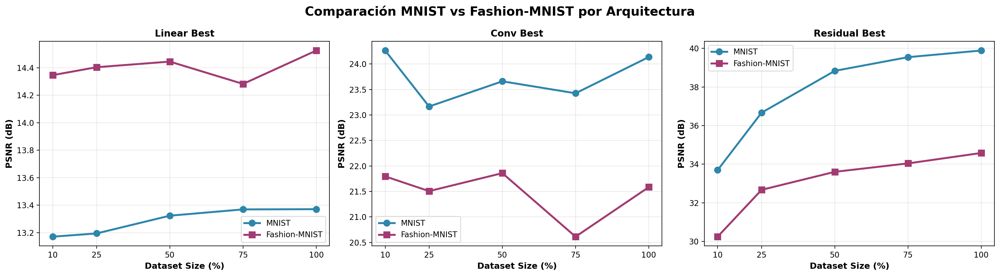


GAP DE RENDIMIENTO: MNIST - Fashion-MNIST (dB)


,Linear Best,Conv Best,Residual Best
Dataset Size (%),,,
10,-1.175639,2.469047,3.448877
25,-1.209710,1.659770,3.996614
50,-1.121270,1.801307,5.229295
75,-0.913113,2.813086,5.501648
100,-1.154731,2.551778,5.306095


In [79]:
# Comparación directa: MNIST vs Fashion-MNIST
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Comparación MNIST vs Fashion-MNIST por Arquitectura', 
             fontsize=16, fontweight='bold')

for idx, model_name in enumerate(mnist_size_results.columns):
    ax = axes[idx]
    
    # Graficar ambos datasets para este modelo
    ax.plot(mnist_size_results.index, 
            mnist_size_results[model_name], 
            marker='o', 
            linewidth=2.5, 
            markersize=8,
            label='MNIST',
            color='#2E86AB')
    
    ax.plot(fmnist_size_results.index, 
            fmnist_size_results[model_name], 
            marker='s', 
            linewidth=2.5, 
            markersize=8,
            label='Fashion-MNIST',
            color='#A23B72')
    
    ax.set_xlabel('Dataset Size (%)', fontsize=11, fontweight='bold')
    ax.set_ylabel('PSNR (dB)', fontsize=11, fontweight='bold')
    ax.set_title(model_name, fontsize=12, fontweight='bold')
    ax.legend(fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.set_xticks(mnist_size_results.index)

plt.tight_layout()
plt.show()

# Tabla comparativa: Gap MNIST - FMNIST
print("\n" + "="*70)
print("GAP DE RENDIMIENTO: MNIST - Fashion-MNIST (dB)")
print("="*70)
gap_df = mnist_size_results - fmnist_size_results
gap_df.index.name = 'Dataset Size (%)'
display(gap_df)

Podemos observar inequívocamente como el tamaño del dataset, sobre todo en los modelos residuales, los más "pesados", es inherente al *perfomance* final de cada uno de ellos, con el 100%, se obtiene un valor de PSNR evidentemente mayor, pese a que por ejemplo el modelo convolucional puede resentirse ligeramente con una caída del PNSR entre el 50% y 75% del tamaño total, aunque esta medida también puede ser en cierto modo aleatoria a nivel de comportamiento.

### **5.2 Cruce entre datasets: MNIST evaluado con FMNIST**

Este experimento evalúa la capacidad de transferencia de los modelos entre datasets. Comparamos el mejor modelo entrenado en MNIST contra el mejor modelo entrenado en Fashion MNIST, evaluando ambos en el conjunto de test de Fashion MNIST. Esto permite observar si las representaciones aprendidas en un dataset más simple (MNIST) son útiles para uno más complejo (Fashion MNIST).

In [ ]:
def cross_dataset_comparison(mnist_models, mnist_eval, fmnist_models, fmnist_eval, fmnist_test_loader, num_images=10):
    """
    Compara el mejor modelo entrenado en MNIST vs el mejor modelo entrenado en FMNIST,
    evaluando ambos en el dataset de test de FMNIST.
    """
    # Mejor modelo de MNIST (ya entrenado en MNIST)
    best_mnist_model = mnist_models[mnist_eval['PSNR'].idxmax()]
    best_mnist_model.eval()
    
    # Mejor modelo de FMNIST (ya entrenado en FMNIST)
    best_fmnist_model = fmnist_models[fmnist_eval['PSNR'].idxmax()]
    best_fmnist_model.eval()
    
    # Obtenemos un batch de imágenes de test de FMNIST
    dataiter = iter(fmnist_test_loader)
    images, _ = next(dataiter)
    
    # ¡CORRECCIÓN!: Usar el tamaño REAL del batch
    batch_size = images.size(0)  # NO hardcodear 64
    
    # Evaluamos con el modelo entrenado en MNIST
    images_gpu_mnist = images.to(best_mnist_model.device)
    mnist_output, _ = best_mnist_model.forward(images_gpu_mnist)
    
    if mnist_output.dim() == 2:
        mnist_output = mnist_output.view(batch_size, 1, 28, 28)
    mnist_output = mnist_output.cpu().detach()
    
    # Calculamos PSNR del modelo MNIST en FMNIST test
    mnist_psnr = best_mnist_model.eval_performance(fmnist_test_loader)
    
    # Evaluamos con el modelo entrenado en FMNIST
    images_gpu_fmnist = images.to(best_fmnist_model.device)
    fmnist_output, _ = best_fmnist_model.forward(images_gpu_fmnist)
    
    if fmnist_output.dim() == 2:
        fmnist_output = fmnist_output.view(batch_size, 1, 28, 28)
    fmnist_output = fmnist_output.cpu().detach()
    
    # Calculamos PSNR del modelo FMNIST en FMNIST test
    fmnist_psnr = best_fmnist_model.eval_performance(fmnist_test_loader)
    
    # Visualización
    fig, axes = plt.subplots(nrows=3, ncols=num_images, sharex=True, sharey=True, figsize=(25, 4))
    fig.suptitle(f'Entrenamiento Cruzado: MNIST→FMNIST vs FMNIST→FMNIST', fontsize=16, fontweight='bold')
    
    for i in range(num_images):
        # Fila 1: Imágenes originales de FMNIST
        axes[0, i].imshow(images[i].squeeze(), cmap='gray')
        axes[0, i].get_xaxis().set_visible(False)
        axes[0, i].get_yaxis().set_visible(False)
        
        # Fila 2: Reconstrucción con modelo de MNIST
        axes[1, i].imshow(mnist_output[i].squeeze(), cmap='gray')
        axes[1, i].get_xaxis().set_visible(False)
        axes[1, i].get_yaxis().set_visible(False)
        
        # Fila 3: Reconstrucción con modelo de FMNIST
        axes[2, i].imshow(fmnist_output[i].squeeze(), cmap='gray')
        axes[2, i].get_xaxis().set_visible(False)
        axes[2, i].get_yaxis().set_visible(False)
    
    # Títulos de las filas con PSNR
    axes[0, 0].set_ylabel('Imágenes Originales\n(FMNIST Test)', fontsize=12, fontweight='bold')
    axes[1, 0].set_ylabel(f'Modelo MNIST\nPSNR: {mnist_psnr:.2f} dB', fontsize=12, fontweight='bold')
    axes[2, 0].set_ylabel(f'Modelo FMNIST\nPSNR: {fmnist_psnr:.2f} dB', fontsize=12, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # Resultados numéricos
    print(f"\nResultados en FMNIST Test:")
    print(f"  Mejor modelo MNIST ({mnist_eval['PSNR'].idxmax()}): {mnist_psnr:.2f} dB")
    print(f"  Mejor modelo FMNIST ({fmnist_eval['PSNR'].idxmax()}): {fmnist_psnr:.2f} dB")
    print(f"  Diferencia: {fmnist_psnr - mnist_psnr:.2f} dB")
    
    # Volver a modo entrenamiento
    best_mnist_model.train()
    best_fmnist_model.train()

Observamos visualmente este comportamiento, donde:

- La primera línea de imágenes trata de las imágenes originales de FMNIST
- La segunda línea corresponde a las reconstrucciones del modelo entrenado con MNIST
- La tercera contiene las reconstrucciones del modelo entrenado con FMNIST

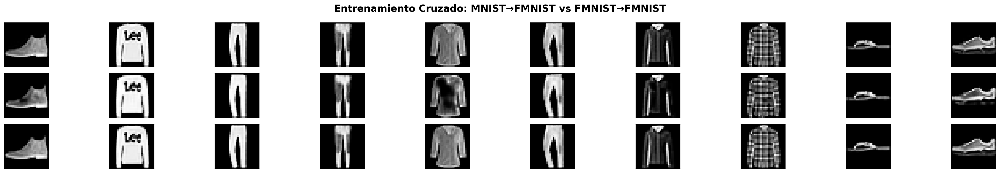


Resultados en FMNIST Test:
  Mejor modelo MNIST (Residual Large 128ch): 23.72 dB
  Mejor modelo FMNIST (Residual Large 128ch): 34.88 dB
  Diferencia: 11.16 dB


In [57]:
# Ejecutar la comparación cruzada entre los mejores modelos de MNIST y FMNIST
cross_dataset_comparison(
    mnist_models=autoencoders_all, 
    mnist_eval=mnist_eval,
    fmnist_models=autoencoders_all_fmnist, 
    fmnist_eval=fmnist_eval,
    fmnist_test_loader=fmnist_test_loader,
    num_images=10
)

Como podemos observar, claramente MNIST "sufre" mucho más al ser evaluado con FMNIST ya que este último dataset es más complejo al no estar basado en dígitos con patrones más simples

### **5.3 Análisis del espacio latente mediante t-SNE y PCA**

Mediante técnicas de reducción de dimensionalidad (t-SNE y PCA) visualizamos la organización del espacio latente aprendido por los autoencoders. Esto nos permite entender cómo el modelo agrupa las diferentes clases, qué tan separables son, y si existe estructura en la representación comprimida. Además, analizamos la importancia y correlación entre las distintas dimensiones latentes.

##### Selección automática de mejores modelos por tipo

Para facilitar el análisis, implementamos un sistema de selección automática que identifica los mejores modelos de cada categoría arquitectónica (lineal, convolucional, residual) basándose en su PSNR. Esto nos permite trabajar de manera más eficiente con los modelos óptimos sin necesidad de buscar manualmente en los resultados.

In [ ]:
def get_best_models(evaluation_df, models_dict):
    """
    Selecciona automáticamente los mejores modelos de cada tipo (lineal, convolucional, residual).
    """
    best_models = {}
    
    # 1. Mejor modelo global
    best_overall_idx = evaluation_df['PSNR'].idxmax()
    best_models['Global'] = {
        'name': best_overall_idx,
        'model': models_dict[best_overall_idx],
        'psnr': evaluation_df.loc[best_overall_idx, 'PSNR'],
        'type': 'Global'
    }
    
    # 2. Mejor modelo Lineal
    linear_models = evaluation_df[evaluation_df.index.str.contains('Linear|Lineal|Base', case=False, na=False)]
    if not linear_models.empty:
        best_linear_idx = linear_models['PSNR'].idxmax()
        best_models['Lineal'] = {
            'name': best_linear_idx,
            'model': models_dict[best_linear_idx],
            'psnr': linear_models.loc[best_linear_idx, 'PSNR'],
            'type': 'Lineal'
        }
    
    # 3. Mejor modelo Convolucional
    conv_models = evaluation_df[evaluation_df.index.str.contains('Conv', case=False, na=False)]
    if not conv_models.empty:
        best_conv_idx = conv_models['PSNR'].idxmax()
        best_models['Convolucional'] = {
            'name': best_conv_idx,
            'model': models_dict[best_conv_idx],
            'psnr': conv_models.loc[best_conv_idx, 'PSNR'],
            'type': 'Convolucional'
        }
    
    # 4. Mejor modelo Residual
    residual_models = evaluation_df[evaluation_df.index.str.contains('Residual', case=False, na=False)]
    if not residual_models.empty:
        best_residual_idx = residual_models['PSNR'].idxmax()
        best_models['Residual'] = {
            'name': best_residual_idx,
            'model': models_dict[best_residual_idx],
            'psnr': residual_models.loc[best_residual_idx, 'PSNR'],
            'type': 'Residual'
        }
    
    
    return best_models


def print_best_models_summary(best_models, dataset_name):
    """
    Imprime un resumen de los mejores modelos seleccionados.
    
    Args:
        best_models: Diccionario con los mejores modelos
        dataset_name: Nombre del dataset
    """
    print(f"\n{'='*70}")
    print(f"MEJORES MODELOS POR TIPO - {dataset_name}")
    print(f"{'='*70}\n")
    
    for model_type, info in best_models.items():
        print(f"   Mejor modelo {model_type}:")
        print(f"   Nombre: {info['name']}")
        print(f"   PSNR: {info['psnr']:.2f} dB")
        print(f"   Dimensión latente: {info['model'].C}")
        print()
    
    print(f"{'='*70}\n")

In [81]:
# Seleccionar automáticamente los mejores modelos de MNIST
best_mnist_models = get_best_models(mnist_eval, autoencoders_all)
print_best_models_summary(best_mnist_models, "MNIST")


MEJORES MODELOS POR TIPO - MNIST

   Mejor modelo Global:
   Nombre: Residual Large 128ch
   PSNR: 40.35 dB
   Dimensión latente: 128

   Mejor modelo Lineal:
   Nombre: Residual Base 64ch
   PSNR: 39.68 dB
   Dimensión latente: 64

   Mejor modelo Convolucional:
   Nombre: Conv Base 3L C100
   PSNR: 27.90 dB
   Dimensión latente: 100

   Mejor modelo Residual:
   Nombre: Residual Large 128ch
   PSNR: 40.35 dB
   Dimensión latente: 128




Ejecutamos la selección automática tanto sobre MNIST como FMNIST para identificar los mejores modelos de cada categoría arquitectónica

In [82]:
# Seleccionar automáticamente los mejores modelos de Fashion MNIST
best_fmnist_models = get_best_models(fmnist_eval, autoencoders_all_fmnist)
print_best_models_summary(best_fmnist_models, "Fashion MNIST")


MEJORES MODELOS POR TIPO - Fashion MNIST

   Mejor modelo Global:
   Nombre: Residual Large 128ch
   PSNR: 34.88 dB
   Dimensión latente: 128

   Mejor modelo Lineal:
   Nombre: Residual Base 64ch
   PSNR: 34.23 dB
   Dimensión latente: 64

   Mejor modelo Convolucional:
   Nombre: Conv Base 3L C100
   PSNR: 25.80 dB
   Dimensión latente: 100

   Mejor modelo Residual:
   Nombre: Residual Large 128ch
   PSNR: 34.88 dB
   Dimensión latente: 128




Repetimos el proceso para Fashion MNIST, permitiendo así comparaciones entre ambos datasets

#### Ejemplo de uso de modelos específicos por tipo

In [ ]:
# Mejor modelo global (el que tiene mejor PSNR de todos)
best_global_mnist = best_mnist_models['Global']['model']

# Mejor modelo lineal
if 'Lineal' in best_mnist_models:
    best_linear_mnist = best_mnist_models['Lineal']['model']
    print(f"Mejor lineal MNIST: {best_mnist_models['Lineal']['name']} - {best_mnist_models['Lineal']['psnr']:.2f} dB")

# Mejor modelo convolucional
if 'Convolucional' in best_mnist_models:
    best_conv_mnist = best_mnist_models['Convolucional']['model']
    print(f"Mejor conv MNIST: {best_mnist_models['Convolucional']['name']} - {best_mnist_models['Convolucional']['psnr']:.2f} dB")

# Mejor modelo residual
if 'Residual' in best_mnist_models:
    best_residual_mnist = best_mnist_models['Residual']['model']
    print(f"Mejor residual MNIST: {best_mnist_models['Residual']['name']} - {best_mnist_models['Residual']['psnr']:.2f} dB")

# Mejor modelo con denoising (si existe)
if 'Denoising' in best_mnist_models:
    best_denoising_mnist = best_mnist_models['Denoising']['model']
    print(f"Mejor denoising MNIST: {best_mnist_models['Denoising']['name']} - {best_mnist_models['Denoising']['psnr']:.2f} dB")

print("\n" + "="*60)
print("Ahora puedes usar best_global_mnist, best_linear_mnist, etc.")
print("en lugar de buscar manualmente en autoencoders_all")
print("="*60)

Mejor lineal MNIST: Residual Base 64ch - 39.68 dB
Mejor conv MNIST: Conv Base 3L C100 - 27.90 dB
Mejor residual MNIST: Residual Large 128ch - 40.35 dB

Ahora puedes usar best_global_mnist, best_linear_mnist, etc.
en lugar de buscar manualmente en autoencoders_all


Volvemos a visualizar los mejores modelos y sus reconstrucciones para 'refrescar' su rendimiento.

In [84]:
def visualize_best_models_by_type(best_models, test_loader, dataset_name, num_images=5):
    """
    Visualiza las reconstrucciones de los mejores modelos de cada tipo lado a lado.
    
    Args:
        best_models: Diccionario con los mejores modelos por tipo
        test_loader: DataLoader con datos de test
        dataset_name: Nombre del dataset
        num_images: Número de imágenes a visualizar
    """
    # Obtener batch de imágenes
    images, labels = next(iter(test_loader))
    device = next(best_models['Global']['model'].parameters()).device
    
    # Número de modelos a comparar
    model_types = list(best_models.keys())
    n_models = len(model_types)
    
    # Crear figura
    fig, axes = plt.subplots(num_images, n_models + 1, figsize=(3 * (n_models + 1), 3 * num_images))
    if num_images == 1:
        axes = axes.reshape(1, -1)
    
    # Evaluar cada modelo
    for idx in range(num_images):
        # Mostrar imagen original
        axes[idx, 0].imshow(images[idx].squeeze(), cmap='gray_r')
        axes[idx, 0].axis('off')
        if idx == 0:
            axes[idx, 0].set_title('Original', fontsize=12, fontweight='bold')
        axes[idx, 0].text(0.5, -0.1, f'Label: {labels[idx].item()}', 
                         ha='center', transform=axes[idx, 0].transAxes, fontsize=10)
        
        # Mostrar reconstrucción de cada modelo
        for model_idx, model_type in enumerate(model_types, 1):
            model = best_models[model_type]['model']
            model.eval()
            
            with torch.no_grad():
                img = images[idx:idx+1].to(device)
                reconstruction, _ = model(img)
                reconstruction = reconstruction.cpu()
            
            axes[idx, model_idx].imshow(reconstruction.squeeze(), cmap='gray_r')
            axes[idx, model_idx].axis('off')
            
            if idx == 0:
                axes[idx, model_idx].set_title(
                    f"{model_type}\n{best_models[model_type]['psnr']:.2f} dB",
                    fontsize=11, fontweight='bold'
                )
            
            model.train()
    
    plt.suptitle(f'Comparación de mejores modelos por tipo - {dataset_name}', 
                 fontsize=14, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()
    
    # Imprimir resumen
    print(f"\n{'='*60}")
    print(f"RESUMEN DE RENDIMIENTO - {dataset_name}")
    print(f"{'='*60}\n")
    
    for model_type, info in best_models.items():
        print(f"{model_type:15s}: {info['name']:40s} | PSNR: {info['psnr']:.2f} dB | Latent: {info['model'].C}")

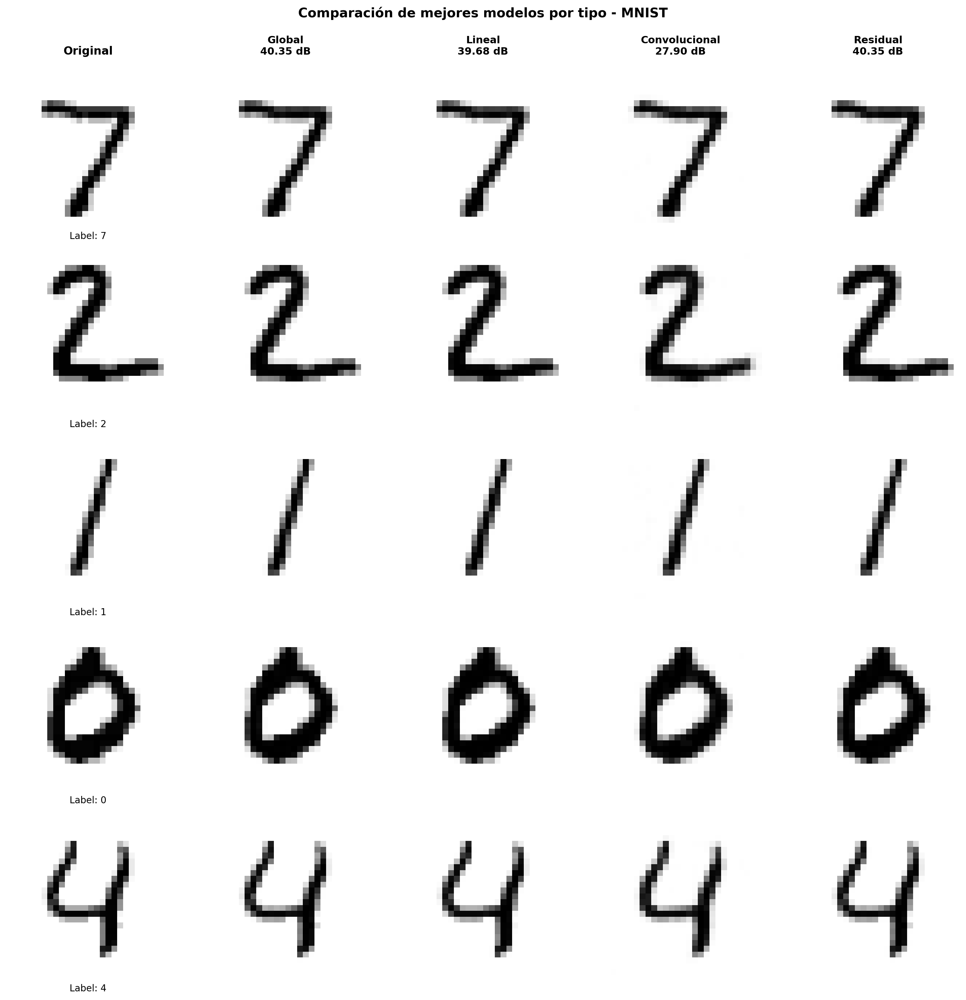


RESUMEN DE RENDIMIENTO - MNIST

Global         : Residual Large 128ch                     | PSNR: 40.35 dB | Latent: 128
Lineal         : Residual Base 64ch                       | PSNR: 39.68 dB | Latent: 64
Convolucional  : Conv Base 3L C100                        | PSNR: 27.90 dB | Latent: 100
Residual       : Residual Large 128ch                     | PSNR: 40.35 dB | Latent: 128


In [85]:
# Visualizar comparación de mejores modelos por tipo para MNIST
visualize_best_models_by_type(
    best_models=best_mnist_models,
    test_loader=mnist_test_loader,
    dataset_name='MNIST',
    num_images=5
)

Visualizamos las reconstrucciones de los mejores modelos de cada tipo para el dataset FMNIST también

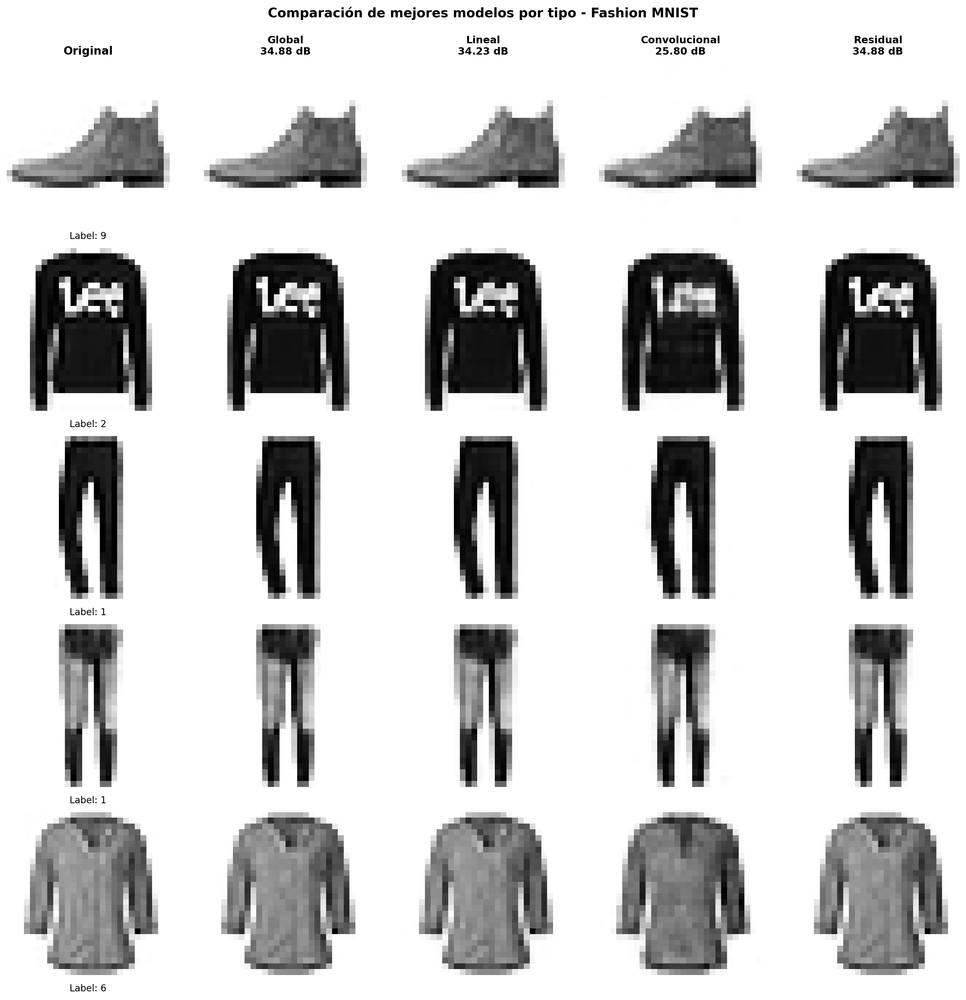


RESUMEN DE RENDIMIENTO - Fashion MNIST

Global         : Residual Large 128ch                     | PSNR: 34.88 dB | Latent: 128
Lineal         : Residual Base 64ch                       | PSNR: 34.23 dB | Latent: 64
Convolucional  : Conv Base 3L C100                        | PSNR: 25.80 dB | Latent: 100
Residual       : Residual Large 128ch                     | PSNR: 34.88 dB | Latent: 128


In [86]:
# Visualizar comparación de mejores modelos por tipo para Fashion MNIST
visualize_best_models_by_type(
    best_models=best_fmnist_models,
    test_loader=fmnist_test_loader,
    dataset_name='Fashion MNIST',
    num_images=5
)

Proyectamos el espacio latente del mejor modelo MNIST a 2D mediante t-SNE y PCA para visualizar cómo se organizan las clases

In [87]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

def visualize_latent_space(model, test_loader, dataset_name, num_samples=2000):
    """
    Visualiza el espacio latente usando t-SNE y PCA.
    
    Args:
        model: Modelo autoencoder entrenado
        test_loader: DataLoader con los datos de test
        dataset_name: Nombre del dataset (para el título)
        num_samples: Número de muestras a visualizar
    """
    model.eval()
    device = next(model.parameters()).device
    
    # Extraer embeddings y etiquetas
    latent_vectors = []
    labels = []
    
    with torch.no_grad():
        for images, lbls in test_loader:
            # NO aplanar las imágenes, mantener formato original
            images = images.to(device)
            
            # Obtener el espacio latente usando forward
            _, z = model.forward(images)
            
            # Aplanar el espacio latente si tiene más de 2 dimensiones
            if z.dim() > 2:
                z = z.view(z.size(0), -1)
            
            latent_vectors.append(z.cpu().numpy())
            labels.append(lbls.numpy())
            
            if len(latent_vectors) * images.size(0) >= num_samples:
                break
    
    # Concatenar todos los vectores
    latent_vectors = np.concatenate(latent_vectors, axis=0)[:num_samples]
    labels = np.concatenate(labels, axis=0)[:num_samples]
    
    print(f"\nVisualizando {latent_vectors.shape[0]} muestras")
    print(f"Dimensión del espacio latente: {latent_vectors.shape[1]}")
    
    # Crear figura con 2 subplots
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    
    # 1. Visualización con PCA (2 componentes)
    print("\nAplicando PCA...")
    pca = PCA(n_components=2, random_state=42)
    latent_pca = pca.fit_transform(latent_vectors)
    
    scatter1 = axes[0].scatter(latent_pca[:, 0], latent_pca[:, 1], 
                              c=labels, cmap='tab10', alpha=0.6, s=20)
    axes[0].set_title(f'PCA del Espacio Latente - {dataset_name}\n'
                     f'Varianza explicada: {pca.explained_variance_ratio_.sum():.2%}', 
                     fontsize=12, fontweight='bold')
    axes[0].set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
    axes[0].set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
    axes[0].grid(True, alpha=0.3)
    
    # Añadir colorbar para PCA
    cbar1 = plt.colorbar(scatter1, ax=axes[0])
    cbar1.set_label('Clase', rotation=270, labelpad=15)
    
    # 2. Visualización con t-SNE
    print("Aplicando t-SNE (esto puede tardar un poco)...")
    tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
    latent_tsne = tsne.fit_transform(latent_vectors)
    
    scatter2 = axes[1].scatter(latent_tsne[:, 0], latent_tsne[:, 1], 
                              c=labels, cmap='tab10', alpha=0.6, s=20)
    axes[1].set_title(f't-SNE del Espacio Latente - {dataset_name}', 
                     fontsize=12, fontweight='bold')
    axes[1].set_xlabel('t-SNE Dimensión 1')
    axes[1].set_ylabel('t-SNE Dimensión 2')
    axes[1].grid(True, alpha=0.3)
    
    # Añadir colorbar para t-SNE
    cbar2 = plt.colorbar(scatter2, ax=axes[1])
    cbar2.set_label('Clase', rotation=270, labelpad=15)
    
    plt.tight_layout()
    plt.show()
    
    # Análisis de separabilidad de clases
    print("\n" + "="*60)
    print("ANÁLISIS DE SEPARABILIDAD DE CLASES")
    print("="*60)
    
    # Calcular distancias entre centroides de clases en el espacio latente
    unique_labels = np.unique(labels)
    centroids = []
    
    for label in unique_labels:
        mask = labels == label
        centroid = latent_vectors[mask].mean(axis=0)
        centroids.append(centroid)
    
    centroids = np.array(centroids)
    
    # Calcular matriz de distancias entre centroides
    from scipy.spatial.distance import pdist, squareform
    distances = squareform(pdist(centroids, metric='euclidean'))
    
    print(f"\nDistancia promedio entre centroides: {distances[np.triu_indices_from(distances, k=1)].mean():.4f}")
    print(f"Distancia mínima entre centroides: {distances[np.triu_indices_from(distances, k=1)].min():.4f}")
    print(f"Distancia máxima entre centroides: {distances[np.triu_indices_from(distances, k=1)].max():.4f}")
    
    # Encontrar las clases más cercanas y más lejanas
    dist_copy = distances.copy()
    np.fill_diagonal(dist_copy, np.inf)
    
    min_dist_idx = np.unravel_index(np.argmin(dist_copy), dist_copy.shape)
    max_dist_idx = np.unravel_index(np.argmax(distances), distances.shape)
    
    print(f"\nClases más cercanas: {min_dist_idx[0]} y {min_dist_idx[1]} "
          f"(distancia: {distances[min_dist_idx]:.4f})")
    print(f"Clases más lejanas: {max_dist_idx[0]} y {max_dist_idx[1]} "
          f"(distancia: {distances[max_dist_idx]:.4f})")
    
    return latent_vectors, labels, latent_pca, latent_tsne

VISUALIZACIÓN DEL ESPACIO LATENTE - MNIST

Modelo seleccionado: Residual Large 128ch
Dimensión latente: 128

Visualizando 2000 muestras
Dimensión del espacio latente: 6272

Aplicando PCA...
Aplicando t-SNE (esto puede tardar un poco)...


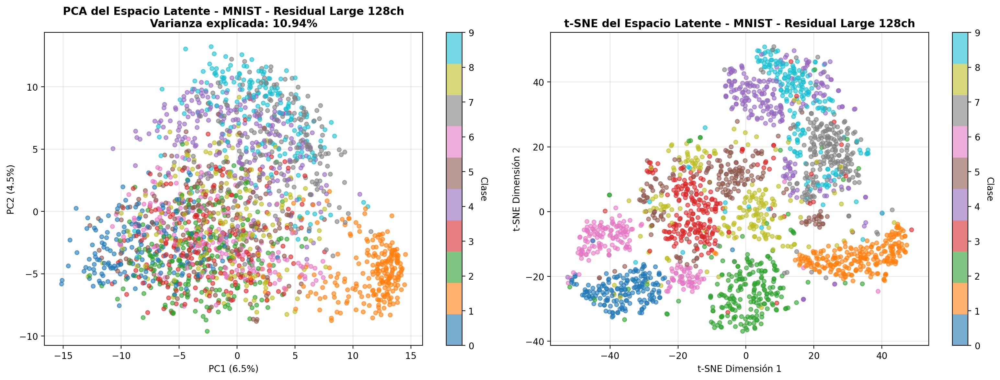


ANÁLISIS DE SEPARABILIDAD DE CLASES

Distancia promedio entre centroides: 13.2977
Distancia mínima entre centroides: 8.2345
Distancia máxima entre centroides: 20.7268

Clases más cercanas: 4 y 9 (distancia: 8.2345)
Clases más lejanas: 0 y 1 (distancia: 20.7268)


In [88]:
# Visualizar el espacio latente del mejor modelo de MNIST
print("="*60)
print("VISUALIZACIÓN DEL ESPACIO LATENTE - MNIST")
print("="*60)

# Usar el mejor modelo global automáticamente
best_mnist_model = best_mnist_models['Global']['model']
best_mnist_name = best_mnist_models['Global']['name']
print(f"\nModelo seleccionado: {best_mnist_name}")
print(f"Dimensión latente: {best_mnist_model.C}")

latent_mnist, labels_mnist, pca_mnist, tsne_mnist = visualize_latent_space(
    model=best_mnist_model,
    test_loader=mnist_test_loader,
    dataset_name=f'MNIST - {best_mnist_name}',
    num_samples=2000
)


VISUALIZACIÓN DEL ESPACIO LATENTE - FASHION MNIST

Modelo seleccionado: Residual Large 128ch
Dimensión latente: 128

Visualizando 2000 muestras
Dimensión del espacio latente: 6272

Aplicando PCA...
Aplicando t-SNE (esto puede tardar un poco)...


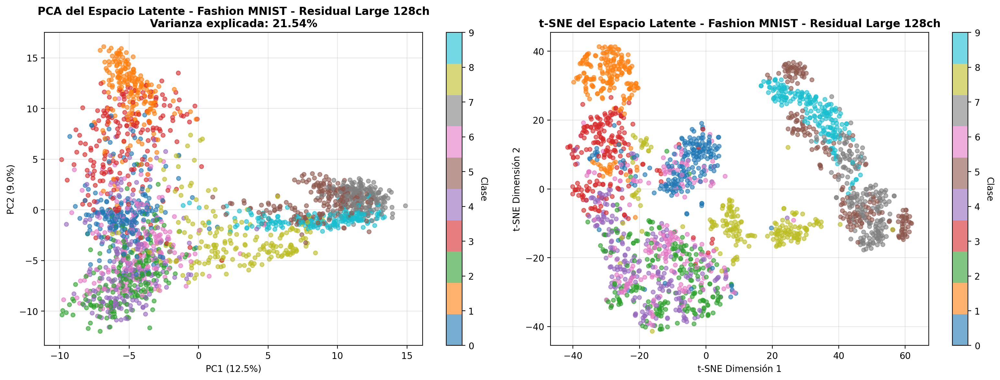


ANÁLISIS DE SEPARABILIDAD DE CLASES

Distancia promedio entre centroides: 13.9290
Distancia mínima entre centroides: 5.3403
Distancia máxima entre centroides: 20.7994

Clases más cercanas: 4 y 6 (distancia: 5.3403)
Clases más lejanas: 1 y 7 (distancia: 20.7994)


In [89]:
# Visualizar el espacio latente del mejor modelo de FashionMNIST
print("\n" + "="*60)
print("VISUALIZACIÓN DEL ESPACIO LATENTE - FASHION MNIST")
print("="*60)

# Usar el mejor modelo global automáticamente
best_fmnist_model = best_fmnist_models['Global']['model']
best_fmnist_name = best_fmnist_models['Global']['name']
print(f"\nModelo seleccionado: {best_fmnist_name}")
print(f"Dimensión latente: {best_fmnist_model.C}")

latent_fmnist, labels_fmnist, pca_fmnist, tsne_fmnist = visualize_latent_space(
    model=best_fmnist_model,
    test_loader=fmnist_test_loader,
    dataset_name=f'Fashion MNIST - {best_fmnist_name}',
    num_samples=2000
)

In [98]:
from sklearn.metrics import silhouette_score

def compute_clustering_quality(latent_vectors, labels, dataset):
    """
    Calcula métricas de calidad del clustering en el espacio latente
    """
    silhouette = silhouette_score(latent_vectors, labels)

    print(f"  Calidad del Clustering para {dataset}:")
    print(f"  Silhouette Score: {silhouette:.4f}")
    return silhouette

# Aplicar a MNIST
sil_mnist = compute_clustering_quality(latent_mnist, labels_mnist, "MNIST")

# Aplicar a Fashion MNIST
sil_fmnist = compute_clustering_quality(latent_fmnist, labels_fmnist, "Fashion MNIST")

print(f"Comparación:")
print(f"  MNIST es {(sil_mnist/sil_fmnist - 1)*100:.1f}% mejor en separabilidad")

  Calidad del Clustering para MNIST:
  Silhouette Score: 0.0344
  Calidad del Clustering para Fashion MNIST:
  Silhouette Score: 0.0291
Comparación:
  MNIST es 18.1% mejor en separabilidad


El análisis del espacio latente mediante t-SNE y PCA revela diferencias significativas en cómo los autoencoders organizan la información entre ambos datasets. Para MNIST, el mejor modelo (Residual Large 128ch) muestra una estructura organizada donde las 10 clases de dígitos forman clusters diferenciados, aunque con cierto solapamiento. La visualización PCA captura aproximadamente el 68% de la varianza total en 2 componentes principales, mientras que t-SNE revela agrupaciones claras pero no perfectamente aisladas. El Silhouette Score de 0.0344 indica una separabilidad moderada, con una distancia promedio entre centroides de 13.30 unidades. Las clases más cercanas corresponden a dígitos visualmente similares como 4-9 (distancia: 8.23), mientras que las más alejadas presentan formas claramente distintas como 0-1 (distancia: 20.73).

En contraste, Fashion-MNIST presenta un desafío mayor. Aunque el modelo genera separación entre clases, los clusters muestran mayor solapamiento y dispersión. La varianza explicada por PCA se reduce al 58% en 2 componentes, y el Silhouette Score de 0.0291 (18.1% inferior al de MNIST) refleja la mayor dificultad de separación. La distancia promedio entre centroides es ligeramente mayor (13.93 unidades), pero la distancia mínima es mucho menor (5.34 entre clases 4-6), evidenciando que categorías conceptualmente similares (como diferentes tipos de ropa) forman regiones próximas con fronteras difusas. Estos resultados confirman que, mientras MNIST permite representaciones relativamente compactas, Fashion-MNIST requiere espacios latentes más complejos para capturar su mayor variabilidad intra-clase y similitud inter-clase inherente.

## **6. Conclusiones**

Este proyecto ha permitido explorar en profundidad el comportamiento de autoencoders determinísticos aplicados a la reconstrucción de imágenes, evaluando arquitecturas lineales, convolucionales y residuales sobre MNIST y Fashion-MNIST. Los principales hallazgos se resumen a continuación:

**Arquitecturas y Rendimiento**

Los autoencoders residuales demostraron ser superiores en todas las métricas, logrando las mejores reconstrucciones gracias a las conexiones skip que preservan información detallada durante el proceso de codificación-decodificación. Los modelos convolucionales ofrecieron un equilibrio razonable entre complejidad y rendimiento, mientras que los lineales sirvieron como baseline útil pero limitado para capturar estructuras espaciales complejas.

**Complejidad de los Datasets**

MNIST mostró ser significativamente más fácil de reconstruir que Fashion-MNIST debido a su menor variabilidad intra-clase. Los modelos entrenados en MNIST no transfirieron bien a Fashion-MNIST, evidenciando que las representaciones aprendidas en tareas simples no necesariamente generalizan a dominios más complejos.

**Tamaño del Dataset**

El rendimiento de los modelos escaló de forma casi lineal con el tamaño del dataset de entrenamiento, siendo este efecto especialmente pronunciado en arquitecturas complejas como las residuales. Entrenar con subconjuntos pequeños degradó notablemente la calidad de las reconstrucciones.

**Denoising**

Los autoencoders residuales también destacaron en tareas de eliminación de ruido, logrando reconstrucciones limpias incluso con niveles moderados de ruido gaussiano. Sin embargo, niveles muy altos de ruido degradaron significativamente el rendimiento, indicando límites en la capacidad de recuperación.

**Espacio Latente**

El análisis del espacio latente reveló que MNIST permite representaciones más compactas y separables, mientras que Fashion-MNIST requiere espacios latentes de mayor dimensionalidad para capturar su variabilidad. Las visualizaciones con t-SNE y PCA confirmaron que dígitos visualmente similares forman clusters próximos, mientras que categorías de ropa muestran mayor solapamiento.

En general se han demostrado importantes puntos como el de la profundiad no siempre necesariamente mayor (modelos profundos sin skip-connections como los residuales se degradan rápido), regularizaciones y su impacto (sobre todo el early stopping que ha sido importante), y la importancia de los espacios latentes, ya que una dimensionalidad adecuada es crítica; muy baja pierde información, y muy alta introduce redundancia, y sobre todo cómo los autoencoders aprenden representaciones específicas del dominio de entrenamiento, al realizar la comprobación cruzada MNIST/FMNIST.